# Variables With Prediction Modelling

Variables with future predictions are used to predict the Absorbance.

The variables are:
* Air temperature
* Daily Cumulated Rainfall
* Water Temperature
* Flow River (River Discharge in the Projections folder)


3 different models are used:
* linear regression
* random forest
* neural network

In [65]:
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.stats.outliers_influence import (
    variance_inflation_factor,
)

import statsmodels.api as sm

from quantile_forest import RandomForestQuantileRegressor

import xgboost as xgb
from lightgbm import LGBMRegressor

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import model_selection
from sklearn.model_selection import cross_validate, train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve

# Hyperparameter Optimization
import optuna

# Neural Network
from sklearn.neural_network import MLPRegressor

# MAPiE
from mapie.regression import MapieQuantileRegressor, MapieRegressor
from mapie.metrics import regression_coverage_score

# Define paths

In [66]:
data_folder = os.path.join("..", "..", "data")

raw_data_folder = os.path.join(data_folder, "raw_data")

# Load dataset

In [67]:
full_df = pd.read_excel(
    os.path.join(raw_data_folder, "raw_full_dataset.xlsx")
)

In [68]:
full_df

,DateTime,nitrate,pH,turbidity,Ammonium,dissolvedoxygen,watertemperature,Conductivity,redoxpotential,ABS254,cumulated_rainfall_24h,flowriver,environmental_temperature
0,2012-08-29,5.54,8.31,3.42,0.01,4.71,28.10,1144.98,220.47,9.07,0.0,100.82,27.02
1,2012-08-30,5.56,8.29,3.10,0.02,4.75,27.57,1205.67,225.81,15.13,0.4,97.40,22.49
2,2012-08-31,5.51,8.31,3.60,0.04,5.08,26.37,1237.20,229.83,15.95,0.0,95.59,21.03
3,2012-09-01,5.49,8.40,4.00,0.06,5.68,25.04,1254.15,231.82,NaN,0.0,94.97,17.81
4,2012-09-02,5.39,8.43,3.97,0.15,5.98,24.75,1244.10,234.80,15.10,0.0,95.48,19.43
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4045,2023-09-26,7.56,8.30,3.96,0.03,5.46,25.95,1628.49,227.69,3.97,0.0,83.50,20.50
4046,2023-09-27,7.28,8.29,4.16,0.02,5.33,26.37,1610.67,227.02,3.81,0.0,81.17,21.76
4047,2023-09-28,7.34,8.27,3.80,0.02,5.23,26.60,1602.33,228.25,3.76,0.0,81.42,22.17
4048,2023-09-29,7.64,8.25,3.89,0.03,5.17,26.73,1613.81,230.54,4.18,0.0,80.71,22.03


In [69]:
full_df.rename(
    columns={
        "flowriver": "Flow River",
        "cumulated_rainfall_24h": "Daily Cumulated Rainfall",
        "environmental_temperature": "Air Temperature",
        "nitrate": "Nitrate",
        "dissolvedoxygen": "Dissolved Oxygen",
        "turbidity": "Turbidity",
        "watertemperature": "Water Temperature",
        "redoxpotential": "Redox Potential",
        "ABS254": "Absorbance 254nm",
    },
    inplace=True,
)

In [70]:
full_df.isna().sum()

DateTime                      0
Nitrate                     176
pH                           99
Turbidity                   218
Ammonium                    413
Dissolved Oxygen            325
Water Temperature            86
Conductivity                141
Redox Potential             273
Absorbance 254nm            551
Daily Cumulated Rainfall     10
Flow River                   46
Air Temperature               1
dtype: int64

In [71]:
full_df = full_df.dropna()

# Remove Variables with no future projections

They are:
- Nitrate
- pH
- Ammonium
- Dissolved Oxygen
- Conductivity
- Redox Potential

In [72]:
full_df.drop(
    columns=[
        "Nitrate",
        "pH",
        "Ammonium",
        "Dissolved Oxygen",
        "Conductivity",
        "Redox Potential",
        "Turbidity",
    ],
    inplace=True,
)

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_62339/670764935.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_df.drop(


## Take the Monthly Average

In [73]:
full_df["Year"] = full_df["DateTime"].dt.year
full_df["Month"] = full_df["DateTime"].dt.month

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_62339/1583524510.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_df["Year"] = full_df["DateTime"].dt.year
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_62339/1583524510.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  full_df["Month"] = full_df["DateTime"].dt.month


In [74]:
# take the monthly average
monthly_avg_df = full_df.groupby(["Year", "Month"]).mean().reset_index()

In [75]:
full_df = monthly_avg_df

In [12]:
full_df["Season"] = full_df["Month"].apply(
    lambda x: "Winter"
    if x in [12, 1, 2]
    else "Spring"
    if x in [3, 4, 5]
    else "Summer"
    if x in [6, 7, 8]
    else "Autumn"
)

# convert Season to integer
full_df["Season"] = full_df["Season"].apply(
    lambda x: 1
    if x == "Winter"
    else 2
    if x == "Spring"
    else 3
    if x == "Summer"
    else 4
)

full_df["Timestamp"] = full_df["DateTime"].apply(
    lambda x: x.timestamp()
)

# Multicollinearity Test

In [13]:
X = full_df[full_df.columns.difference(["DateTime"])]


vif_test = pd.DataFrame()
vif_test["variable"] = X.columns
vif_test["VIF"] = [
    variance_inflation_factor(X.values, i) for i in range(X.shape[1])
]

In [14]:
vif_test

,variable,VIF
0,Absorbance 254nm,2.429610
1,Air Temperature,17.924208
2,Daily Cumulated Rainfall,1.244934
3,Flow River,3.048469
4,Month,10.085438
5,Season,3.466508
6,Timestamp,426.574935
7,Water Temperature,29.528459
8,Year,572.371629


In [15]:
X = full_df[full_df.columns.difference(["DateTime"])]


vif_test = pd.DataFrame()
vif_test["variable"] = X.columns
vif_test["VIF"] = [
    variance_inflation_factor(X.values, i) for i in range(X.shape[1])
]

In [16]:
vif_test

,variable,VIF
0,Absorbance 254nm,2.429610
1,Air Temperature,17.924208
2,Daily Cumulated Rainfall,1.244934
3,Flow River,3.048469
4,Month,10.085438
5,Season,3.466508
6,Timestamp,426.574935
7,Water Temperature,29.528459
8,Year,572.371629


# Linear Regression

## All Features + Year

In [17]:
setting = "All Features + Year"

### Split Data

In [18]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Month", "Season"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [19]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2022-01-01"]
X_test = X[X["DateTime"] >= "2022-01-01"]

y_train = y[y["DateTime"] < "2022-01-01"]
y_test = y[y["DateTime"] >= "2022-01-01"]

In [20]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

In [21]:
scaler = StandardScaler()

X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### With available future projections

#### Train Model

In [22]:
model = sm.OLS(y_train_fit.values, sm.add_constant(X_train_fit)).fit()

In [23]:
results = model.summary2()

#### Results

In [24]:
print(results)

                    Results: Ordinary least squares
Model:                 OLS                Adj. R-squared:       0.479   
Dependent Variable:    y                  AIC:                  596.0856
Date:                  2024-04-16 22:24   BIC:                  612.0094
No. Observations:      105                Log-Likelihood:       -292.04 
Df Model:              5                  F-statistic:          20.16   
Df Residuals:          99                 Prob (F-statistic):   8.08e-14
R-squared:             0.504              Scale:                16.179  
------------------------------------------------------------------------
                          Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
------------------------------------------------------------------------
const                    12.4540   0.3925 31.7273 0.0000 11.6751 13.2328
Air Temperature          -0.6965   1.2750 -0.5463 0.5861 -3.2263  1.8333
Daily Cumulated Rainfall -0.1713   0.4188 -0.4090 0.6834 -1.0023  0.6597

#### Predictions

In [25]:
# predict the model
predictions = model.get_prediction(
    sm.add_constant(X_test_fit)
).summary_frame(alpha=0.05)

In [26]:
train_res = model.resid

#### Plots

In [27]:
rmse = np.sqrt(mean_squared_error(y_test_fit, predictions["mean"]))
r2 = r2_score(y_test_fit, predictions["mean"])

print(f"RMSE: {rmse}")
print(f"R2: {r2}")

RMSE: 2.9273435575928244
R2: 0.3219389139662081


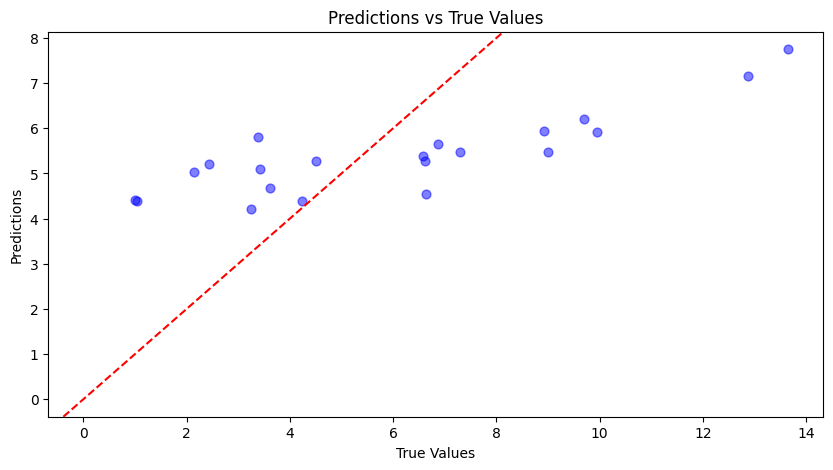

In [28]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit, predictions["mean"], c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

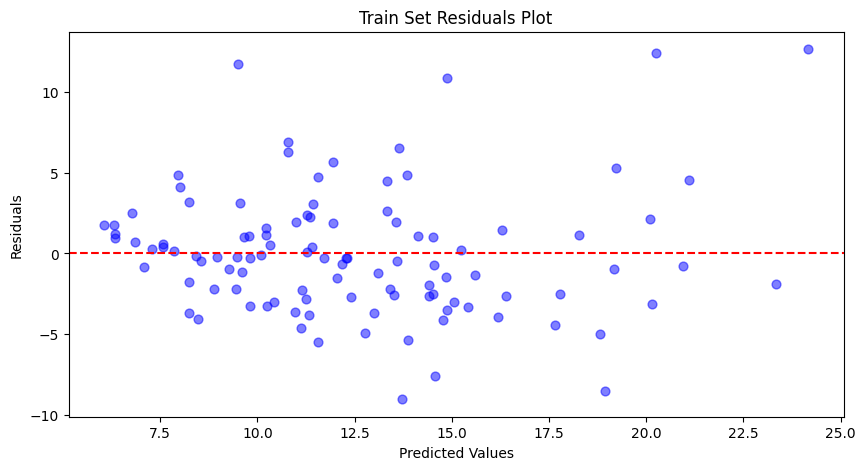

In [29]:
# plot the residuals
plt.figure(figsize=(10, 5))
plt.scatter(model.fittedvalues, train_res, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Train Set Residuals Plot")
plt.show()

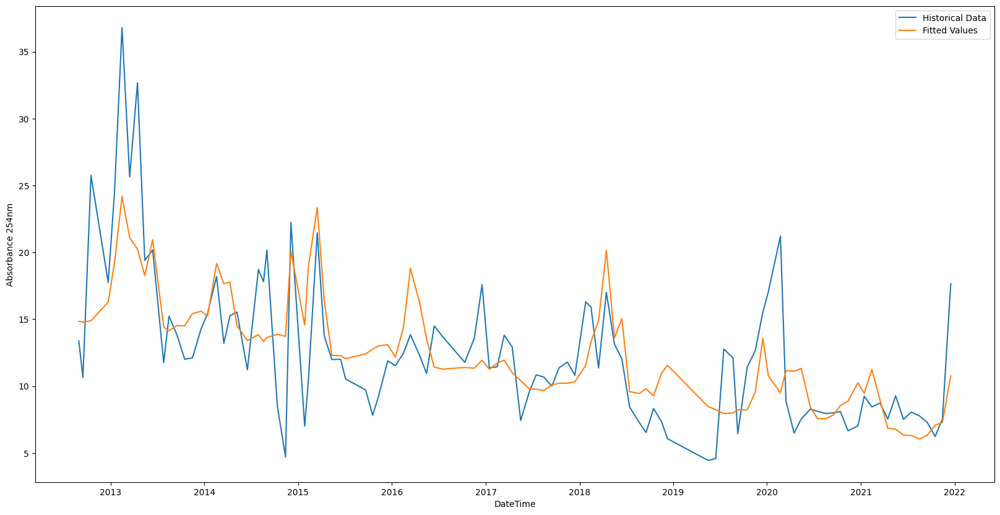

In [30]:
# plot the fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"],
    y=model.fittedvalues.values,
    label="Fitted Values",
)

plt.show()

In [31]:
residuals = (
    y_test_fit["Absorbance 254nm"].values - predictions["mean"].values
)

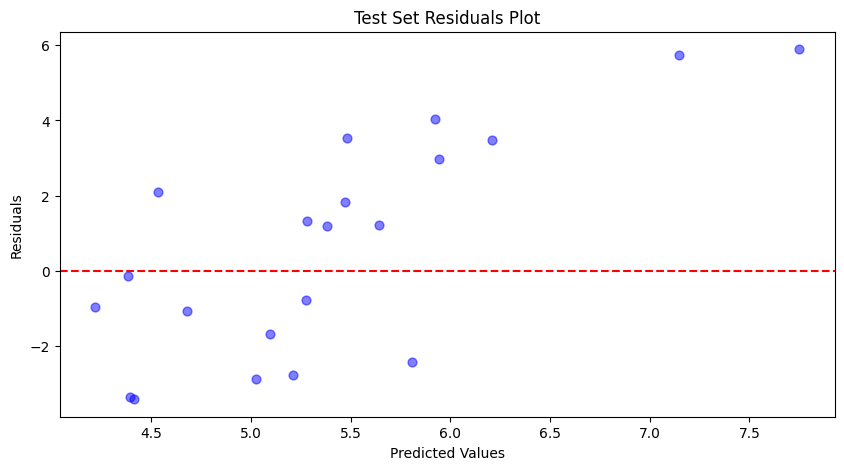

In [32]:
# plot the residuals
plt.figure(figsize=(10, 5))
plt.scatter(predictions["mean"], residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

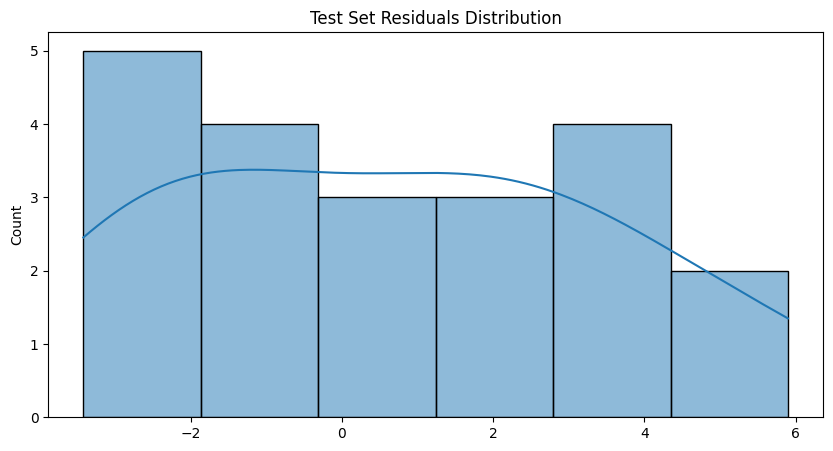

In [33]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

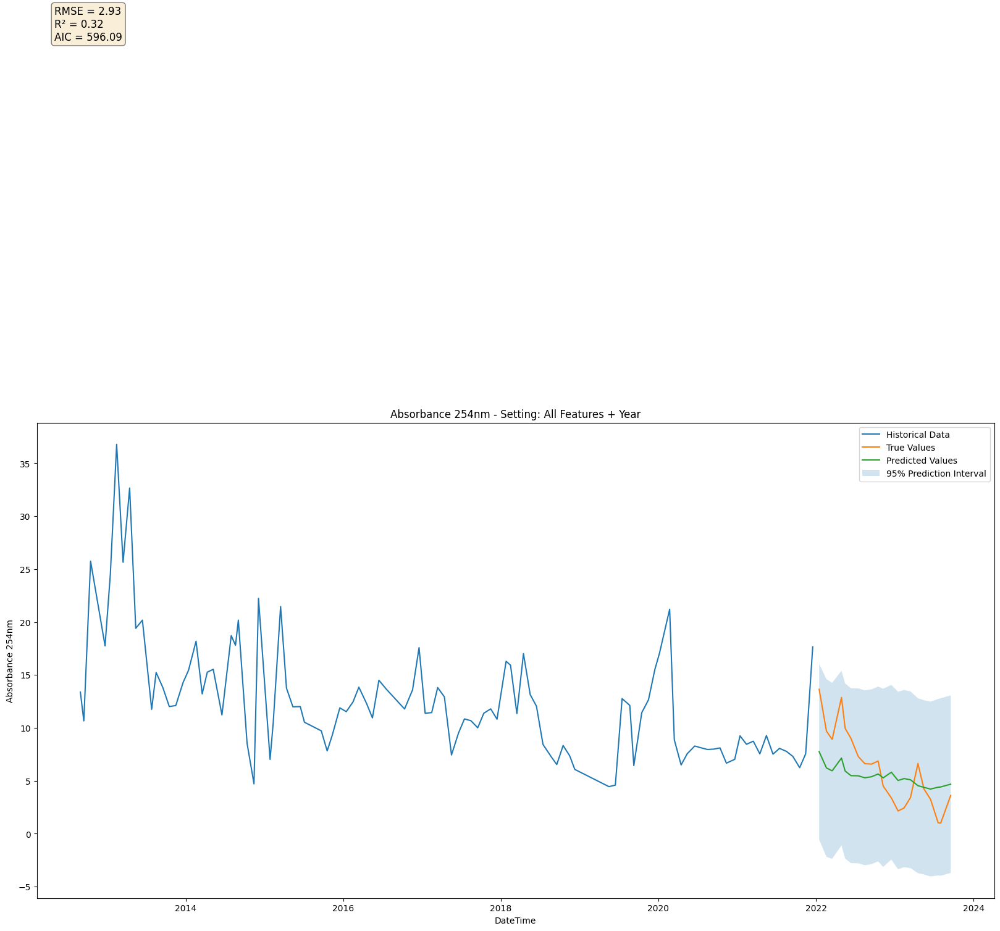

In [34]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
# sns.lineplot(x=y_train['DateTime'], y=model.fittedvalues.values, label='Fitted Values')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=predictions["mean"].values,
    label="Predicted Values",
)
plt.fill_between(
    y_test["DateTime"],
    predictions["obs_ci_lower"],
    predictions["obs_ci_upper"],
    alpha=0.2,
    label="95% Prediction Interval",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"AIC = {model.aic:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Setting: {setting}")

plt.legend()
plt.show()

#### Store Results

In [35]:
lr_pred = predictions["mean"]
lr_lower_bound = predictions["obs_ci_lower"]
lr_upper_bound = predictions["obs_ci_upper"]
lr_rmse = rmse
lr_r2 = r2

## All Features + Year w/ log(y)

In [36]:
setting = "Ammonium + Flow River + Redox Potential + Turbidity + Year"

### Split Data

In [37]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Month", "Season"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

# scale y to ln(y)
y["Absorbance 254nm"] = np.log(y["Absorbance 254nm"])

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_62339/738356443.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y["Absorbance 254nm"] = np.log(y["Absorbance 254nm"])


In [38]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2022-01-01"]
X_test = X[X["DateTime"] >= "2022-01-01"]

y_train = y[y["DateTime"] < "2022-01-01"]
y_test = y[y["DateTime"] >= "2022-01-01"]

In [39]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

# scale the data
scaler = StandardScaler()

X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

In [40]:
model = sm.OLS(y_train_fit.values, sm.add_constant(X_train_fit)).fit()

In [41]:
results = model.summary2()

### Results

In [42]:
print(results)

                    Results: Ordinary least squares
Model:                 OLS                Adj. R-squared:       0.461   
Dependent Variable:    y                  AIC:                  51.2578 
Date:                  2024-04-16 22:24   BIC:                  67.1816 
No. Observations:      105                Log-Likelihood:       -19.629 
Df Model:              5                  F-statistic:          18.80   
Df Residuals:          99                 Prob (F-statistic):   4.24e-13
R-squared:             0.487              Scale:                0.090252
------------------------------------------------------------------------
                          Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
------------------------------------------------------------------------
const                     2.4365   0.0293 83.1051 0.0000  2.3783  2.4946
Air Temperature           0.0036   0.0952  0.0377 0.9700 -0.1854  0.1925
Daily Cumulated Rainfall -0.0294   0.0313 -0.9405 0.3493 -0.0915  0.0327

### Predictions

In [43]:
# predict the model
predictions = model.get_prediction(
    sm.add_constant(X_test_fit)
).summary_frame(alpha=0.05)

In [44]:
predictions

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,2.104895,0.087449,1.931378,2.278412,1.484057,2.725733
1,2.032439,0.097951,1.838083,2.226796,1.405457,2.659421
2,1.963967,0.088430,1.788501,2.139432,1.342581,2.585352
3,2.072479,0.078872,1.915980,2.228979,1.456181,2.688778
4,1.976980,0.082638,1.813008,2.140951,1.358741,2.595218
5,1.946765,0.081116,1.785813,2.107717,1.329321,2.564209
6,1.926041,0.080743,1.765830,2.086252,1.308789,2.543292
7,1.890121,0.081029,1.729343,2.050900,1.272723,2.507520
8,1.868544,0.080512,1.708790,2.028298,1.251411,2.485677
9,1.922781,0.079828,1.764385,2.081176,1.305998,2.539563


In [45]:
# rescale the data
y_train["Absorbance 254nm"] = np.exp(y_train["Absorbance 254nm"])
y_test["Absorbance 254nm"] = np.exp(y_test["Absorbance 254nm"])
y_test_fit = np.exp(y_test_fit)

predictions["mean"] = np.exp(predictions["mean"])
predictions["obs_ci_lower"] = np.exp(predictions["obs_ci_lower"])
predictions["obs_ci_upper"] = np.exp(predictions["obs_ci_upper"])

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_62339/1342579983.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_train["Absorbance 254nm"] = np.exp(y_train["Absorbance 254nm"])
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_62339/1342579983.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y_test["Absorbance 254nm"] = np.exp(y_test["Absorbance 254nm"])


### Plots

In [46]:
rmse = np.sqrt(mean_squared_error(y_test_fit, predictions["mean"]))
r2 = r2_score(y_test_fit, predictions["mean"])

print(f"RMSE: {rmse}")
print(f"R2: {r2}")

RMSE: 3.2065155314548766
R2: 0.1864427365457465


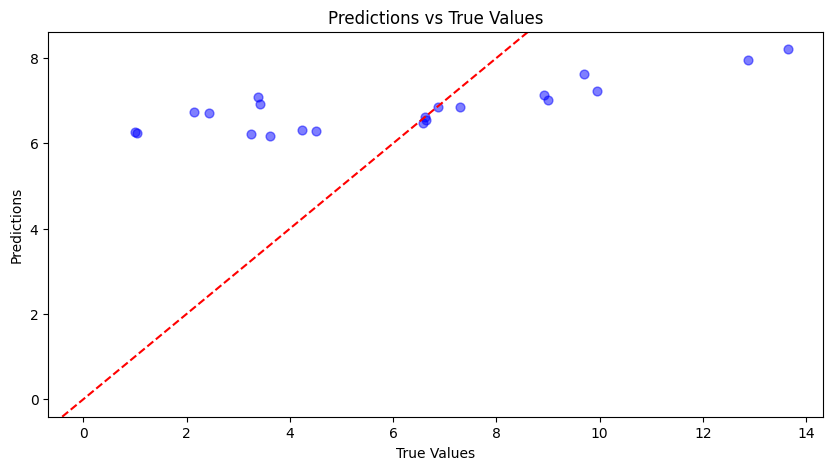

In [47]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit, predictions["mean"], c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

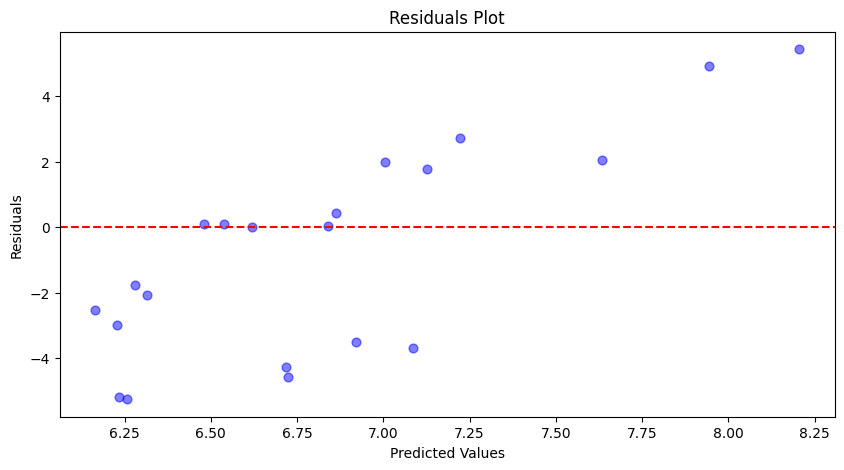

In [48]:
# plot the residuals
residuals = (
    y_test_fit["Absorbance 254nm"].values - predictions["mean"].values
)
plt.figure(figsize=(10, 5))
plt.scatter(predictions["mean"], residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals Plot")
plt.show()

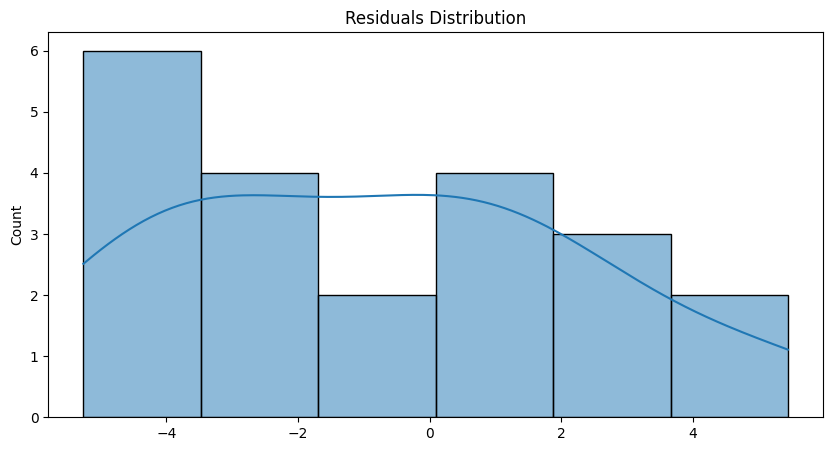

In [49]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Residuals Distribution")
plt.show()

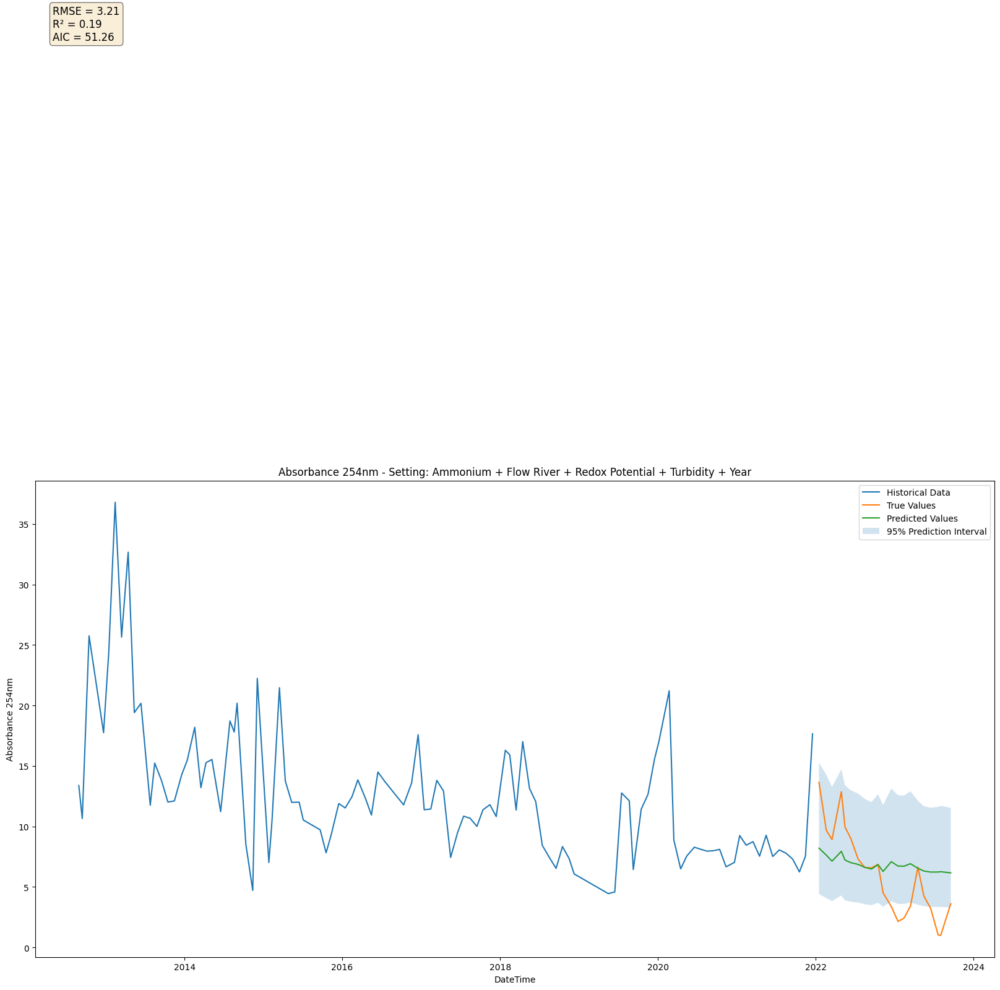

In [50]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=predictions["mean"].values,
    label="Predicted Values",
)
plt.fill_between(
    y_test["DateTime"],
    predictions["obs_ci_lower"],
    predictions["obs_ci_upper"],
    alpha=0.2,
    label="95% Prediction Interval",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"AIC = {model.aic:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Setting: {setting}")

plt.legend()
plt.show()

### Store Results

In [51]:
log_pred = predictions["mean"]
log_lower_bound = predictions["obs_ci_lower"]
log_upper_bound = predictions["obs_ci_upper"]
log_rmse = rmse
log_r2 = r2

## All Features + Year + Polynomial Features

### Split Data

In [52]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Month", "Season"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [53]:
# add polynomial features
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(2)

X_poly = poly.fit_transform(
    X[X.columns.difference(["DateTime"] + further_features)]
)

X_poly = pd.DataFrame(
    X_poly,
    columns=poly.get_feature_names_out(
        X.columns.difference(["DateTime"] + further_features)
    ),
)

X_poly["DateTime"] = X["DateTime"].values

X_poly[further_features] = X[further_features].values

In [54]:
# split data such that 2022 and 2023 are test data
X_train = X_poly[X_poly["DateTime"] < "2022-01-01"]
X_test = X_poly[X_poly["DateTime"] >= "2022-01-01"]

y_train = y[y["DateTime"] < "2022-01-01"]
y_test = y[y["DateTime"] >= "2022-01-01"]

In [55]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

In [56]:
scaler = StandardScaler()

X_train_fit = scaler.fit_transform(
    X_train_fit[X_train_fit.columns.difference(further_features)]
)
X_test_fit = scaler.transform(
    X_test_fit[X_test_fit.columns.difference(further_features)]
)

X_train_fit = pd.DataFrame(
    X_train_fit,
    columns=X_train.columns.difference(["DateTime"] + further_features),
)
X_test_fit = pd.DataFrame(
    X_test_fit,
    columns=X_test.columns.difference(["DateTime"] + further_features),
)

X_train_fit[further_features] = X_train[further_features].values
X_test_fit[further_features] = X_test[further_features].values

### Train Model

In [57]:
model = sm.OLS(y_train_fit.values, sm.add_constant(X_train_fit)).fit()

In [58]:
results = model.summary2()

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/statsmodels/regression/linear_model.py:1966: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


### Results

In [59]:
print(results)

                                Results: Ordinary least squares
Model:                         OLS                        Adj. R-squared:               0.534   
Dependent Variable:            y                          AIC:                          593.2000
Date:                          2024-04-16 22:24           BIC:                          635.6634
No. Observations:              105                        Log-Likelihood:               -280.60 
Df Model:                      15                         F-statistic:                  8.956   
Df Residuals:                  89                         Prob (F-statistic):           3.12e-12
R-squared:                     0.602                      Scale:                        14.472  
------------------------------------------------------------------------------------------------
                                             Coef.   Std.Err.    t    P>|t|    [0.025    0.975] 
---------------------------------------------------------------

### Predictions

In [60]:
# predict the model
predictions = model.get_prediction(
    sm.add_constant(X_test_fit)
).summary_frame(alpha=0.05)

In [61]:
train_res = model.resid

### Plots

In [62]:
rmse = np.sqrt(mean_squared_error(y_test_fit, predictions["mean"]))
r2 = r2_score(y_test_fit, predictions["mean"])

print(f"RMSE: {rmse}")
print(f"R2: {r2}")

RMSE: 3.166125282598855
R2: 0.20680928340651772


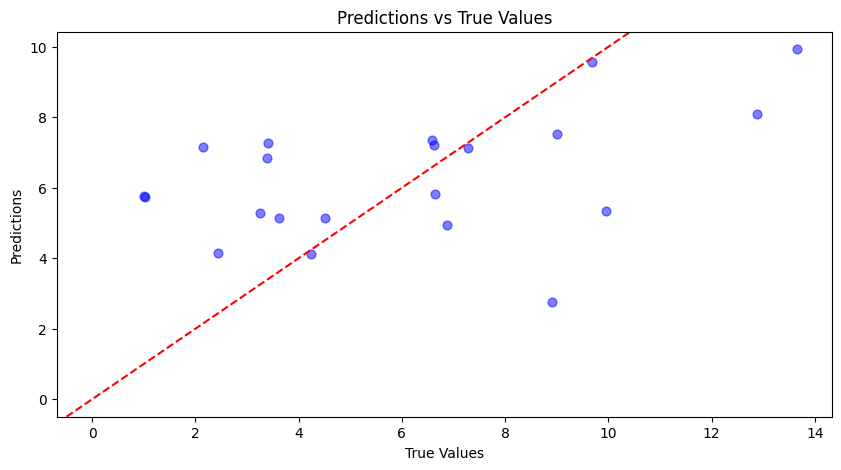

In [63]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit, predictions["mean"], c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

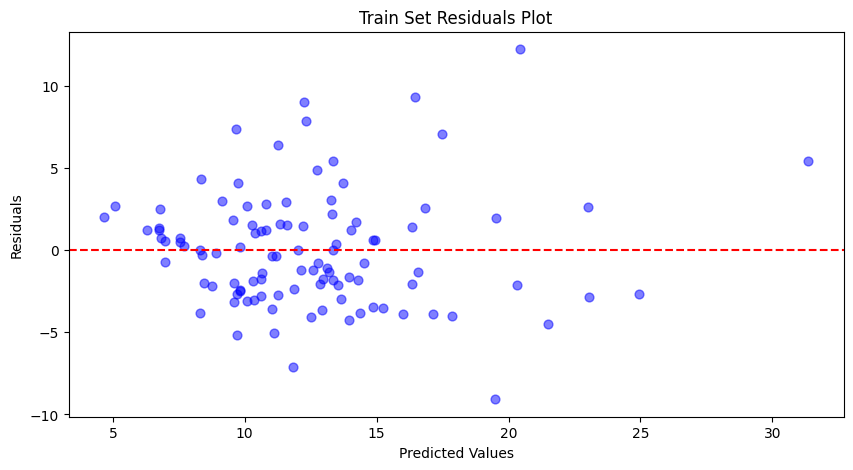

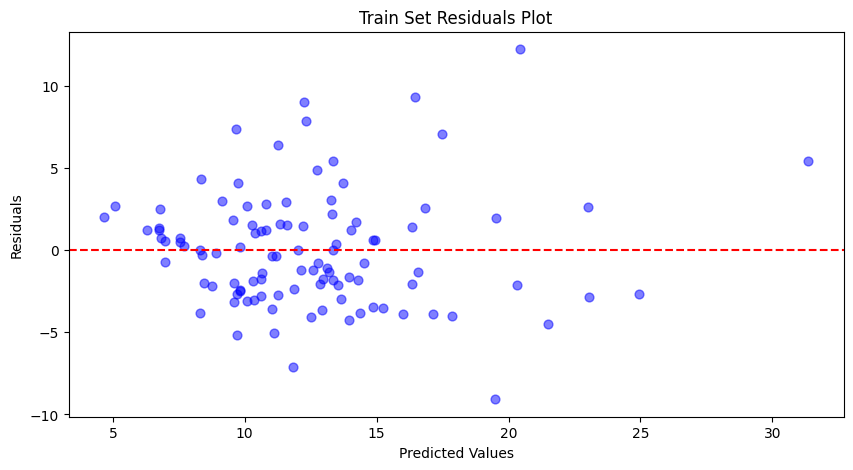

In [ ]:
# plot the residuals
plt.figure(figsize=(10, 5))
plt.scatter(model.fittedvalues, train_res, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Train Set Residuals Plot")
plt.show()

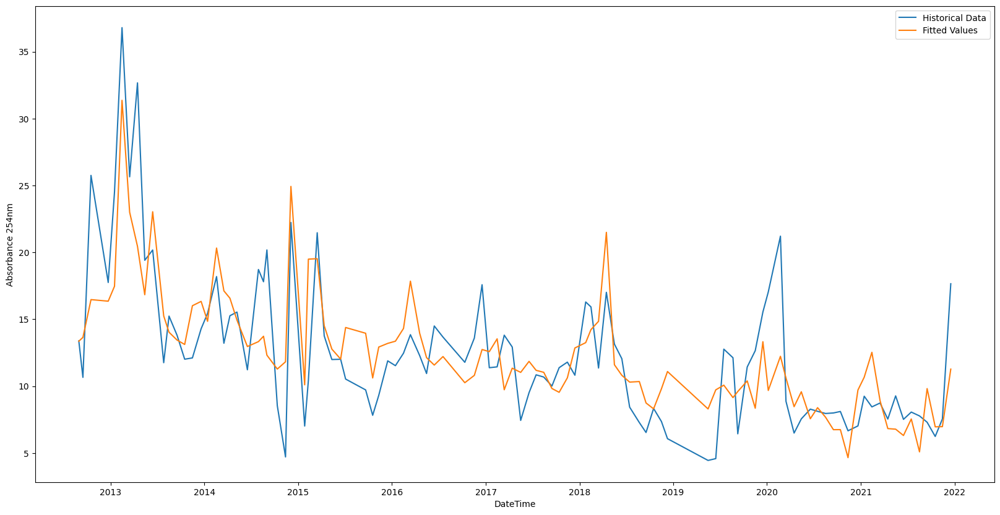

In [ ]:
# plot the fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"],
    y=model.fittedvalues.values,
    label="Fitted Values",
)

plt.show()

In [ ]:
residuals = (
    y_test_fit["Absorbance 254nm"].values - predictions["mean"].values
)

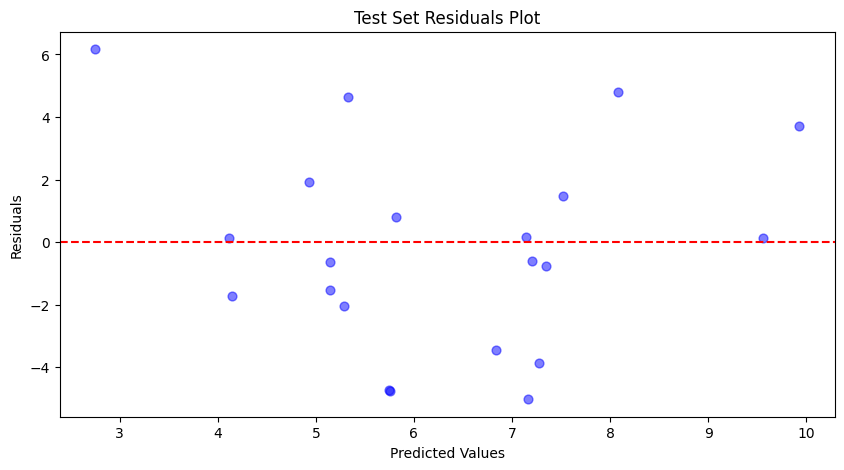

In [ ]:
# plot the residuals
plt.figure(figsize=(10, 5))
plt.scatter(predictions["mean"], residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

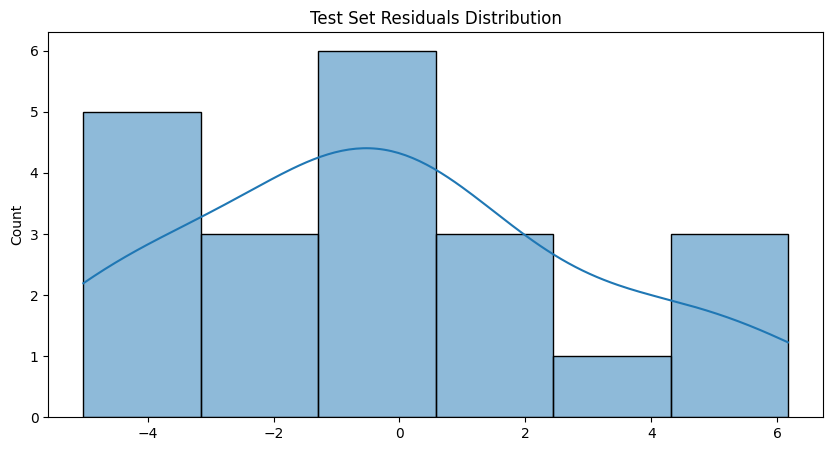

In [ ]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

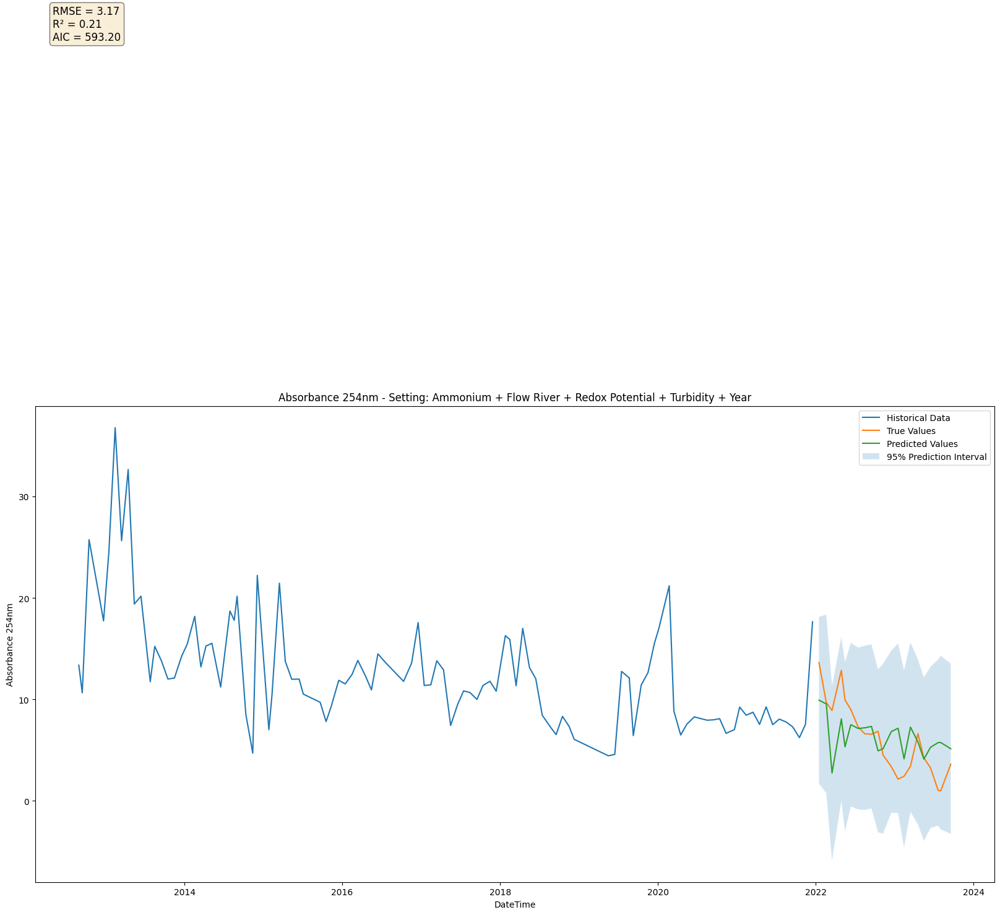

In [ ]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
# sns.lineplot(x=y_train['DateTime'], y=model.fittedvalues.values, label='Fitted Values')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=predictions["mean"].values,
    label="Predicted Values",
)
plt.fill_between(
    y_test["DateTime"],
    predictions["obs_ci_lower"],
    predictions["obs_ci_upper"],
    alpha=0.2,
    label="95% Prediction Interval",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"AIC = {model.aic:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Setting: {setting}")

plt.legend()
plt.show()

### Store Results

In [ ]:
poly_pred = predictions["mean"]
poly_lower_bound = predictions["obs_ci_lower"]
poly_upper_bound = predictions["obs_ci_upper"]
poly_rmse = rmse
poly_r2 = r2

## Final Plot

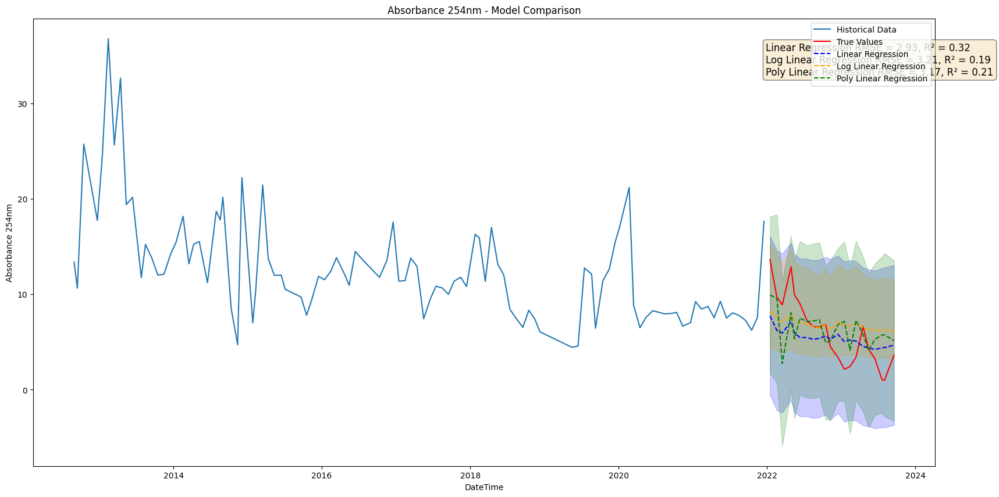

In [ ]:
# create a plot for the comparison of the models
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
    color="red",
)

# Linear Regression
sns.lineplot(
    x=y_test["DateTime"],
    y=lr_pred.values,
    label="Linear Regression",
    linestyle="--",
    color="blue",
)
plt.fill_between(
    y_test["DateTime"],
    lr_lower_bound,
    lr_upper_bound,
    alpha=0.2,
    color="blue",
)

# Linear Regression Log
sns.lineplot(
    x=y_test["DateTime"],
    y=log_pred.values,
    label="Log Linear Regression",
    linestyle="--",
    color="orange",
)
plt.fill_between(
    y_test["DateTime"],
    log_lower_bound,
    log_upper_bound,
    alpha=0.2,
    color="orange",
)

# Linear Regression Poly
sns.lineplot(
    x=y_test["DateTime"],
    y=poly_pred.values,
    label="Poly Linear Regression",
    linestyle="--",
    color="green",
)
plt.fill_between(
    y_test["DateTime"],
    poly_lower_bound,
    poly_upper_bound,
    alpha=0.2,
    color="green",
)

plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"Linear Regression RMSE = {lr_rmse:.2f}, R\u00b2 = {lr_r2:.2f}",
        f"Log Linear Regression RMSE = {log_rmse:.2f}, R\u00b2 = {log_r2:.2f}",
        f"Poly Linear Regression RMSE = {poly_rmse:.2f}, R\u00b2 = {poly_r2:.2f}",
    )
)

plt.text(
    y_test["DateTime"].iloc[0] - pd.Timedelta(days=20),
    33,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Model Comparison")

plt.legend()
plt.show()

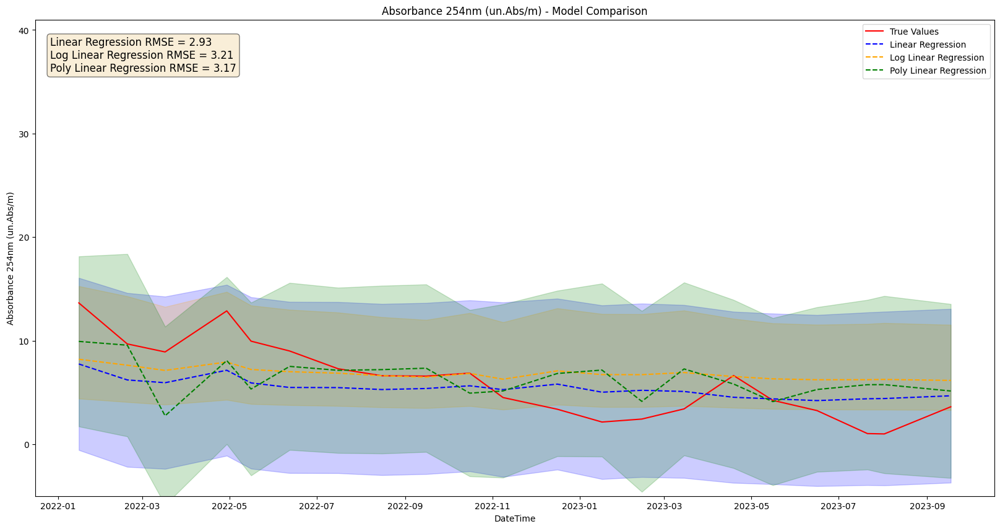

In [ ]:
# create a plot for the comparison of the models
plt.figure(figsize=(20, 10))
# sns.lineplot(x=y_train['DateTime'], y=y_train['Absorbance 254nm'], label='Historical Data')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
    color="red",
)

# Linear Regression
sns.lineplot(
    x=y_test["DateTime"],
    y=lr_pred.values,
    label="Linear Regression",
    linestyle="--",
    color="blue",
)
plt.fill_between(
    y_test["DateTime"],
    lr_lower_bound,
    lr_upper_bound,
    alpha=0.2,
    color="blue",
)

# Linear Regression Log
sns.lineplot(
    x=y_test["DateTime"],
    y=log_pred.values,
    label="Log Linear Regression",
    linestyle="--",
    color="orange",
)
plt.fill_between(
    y_test["DateTime"],
    log_lower_bound,
    log_upper_bound,
    alpha=0.2,
    color="orange",
)

# Linear Regression Poly
sns.lineplot(
    x=y_test["DateTime"],
    y=poly_pred.values,
    label="Poly Linear Regression",
    linestyle="--",
    color="green",
)
plt.fill_between(
    y_test["DateTime"],
    poly_lower_bound,
    poly_upper_bound,
    alpha=0.2,
    color="green",
)

# change the y range to see the differences
plt.ylim(-5, 41)

plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm (un.Abs/m)")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"Linear Regression RMSE = {lr_rmse:.2f}",
        f"Log Linear Regression RMSE = {log_rmse:.2f}",
        f"Poly Linear Regression RMSE = {poly_rmse:.2f}",
    )
)

plt.text(
    y_test["DateTime"].iloc[0] - pd.Timedelta(days=20),
    36,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm (un.Abs/m) - Model Comparison")

plt.legend()
plt.show()

# Random Forest

In [ ]:
setting = "All Features + Year"

### Split Data

In [ ]:
X = full_df[
    full_df.columns.difference(
        ["Absorbance 254nm", "Season", "Month", "Timestamp"]
    )
]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [ ]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2022-01-01"]
X_test = X[X["DateTime"] >= "2022-01-01"]

y_train = y[y["DateTime"] < "2022-01-01"]
y_test = y[y["DateTime"] >= "2022-01-01"]

In [ ]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

### Train Model

#### Perform K-Fold Cross-Validation

K = 10 since the training set is composed of 10 years (almost).

In [ ]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold

In [ ]:
rf_model = RandomForestQuantileRegressor(
    n_estimators=20, max_features="log2", max_depth=7, random_state=42
)

cv = KFold(n_splits=10)

rf_ensemble = cross_validate(
    rf_model,
    X_train_fit,
    y_train_fit.values.flatten(),
    cv=cv,
    scoring="neg_mean_squared_error",
    return_estimator=True,
    return_train_score=True,
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted wit

### Results

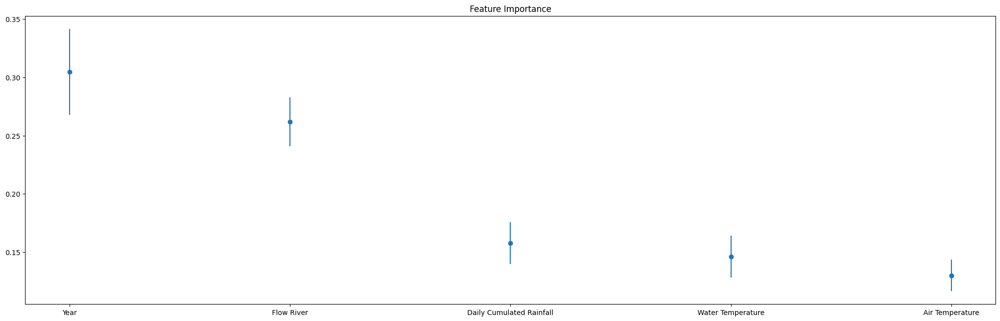

In [ ]:
# show the importance of each feature in the model
feature_importance = pd.DataFrame()
feature_importance["feature"] = X_train_fit.columns
feature_importance["importance_mean"] = np.mean(
    [
        estimator.feature_importances_
        for estimator in rf_ensemble["estimator"]
    ],
    axis=0,
)
feature_importance["importance_std"] = np.std(
    [
        estimator.feature_importances_
        for estimator in rf_ensemble["estimator"]
    ],
    axis=0,
)

feature_importance = feature_importance.sort_values(
    by="importance_mean", ascending=False
)

# plot the importance of each feature with the std
plt.figure(figsize=(25, 7.5))
plt.errorbar(
    x=feature_importance["feature"],
    y=feature_importance["importance_mean"],
    yerr=feature_importance["importance_std"],
    fmt="o",
)
plt.title("Feature Importance")
plt.show()

### Predictions

In [ ]:
# get predictions
mean_predictions = np.array(
    [
        estimator.predict(X_test_fit, quantiles=0.5)
        for estimator in rf_ensemble["estimator"]
    ]
)
lower_bound_predictions = np.array(
    [
        estimator.predict(X_test_fit, quantiles=0.05)
        for estimator in rf_ensemble["estimator"]
    ]
)
upper_bound_predictions = np.array(
    [
        estimator.predict(X_test_fit, quantiles=0.95)
        for estimator in rf_ensemble["estimator"]
    ]
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted wit

In [ ]:
mean_predictions = np.mean(mean_predictions, axis=0)
lower_bound_predictions = np.mean(lower_bound_predictions, axis=0)
upper_bound_predictions = np.mean(upper_bound_predictions, axis=0)

In [ ]:
rmse = np.sqrt(mean_squared_error(y_test_fit, mean_predictions))
r2 = r2_score(y_test_fit, mean_predictions)

print(f"RMSE: {rmse:.2f}")
print(f"R\u00b2: {r2:.2f}")

RMSE: 4.60
R²: -0.68


### Plots

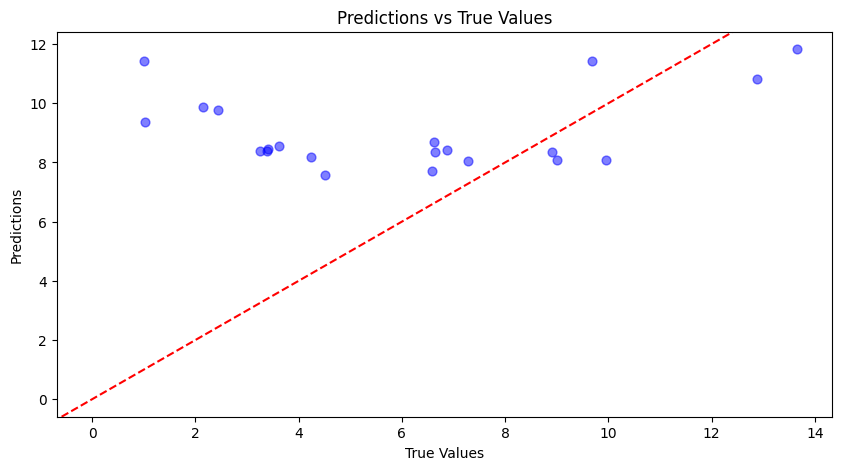

In [ ]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(y_test_fit.values, mean_predictions, c="b", s=40, alpha=0.5)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

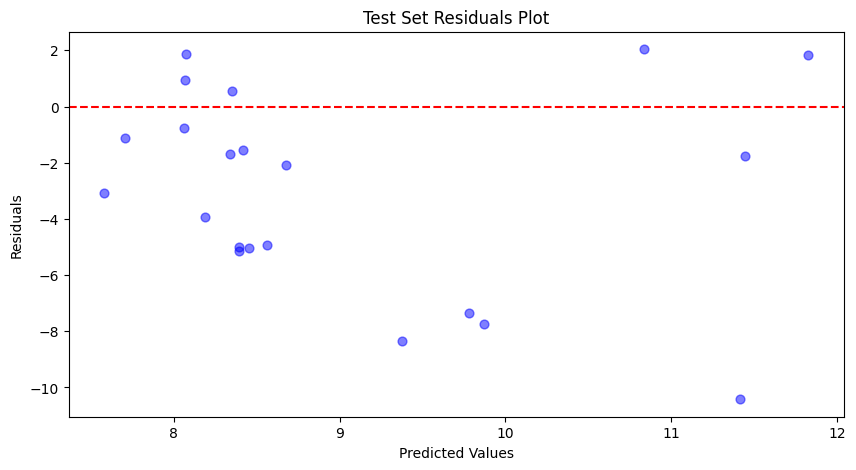

In [ ]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - mean_predictions
plt.figure(figsize=(10, 5))
plt.scatter(mean_predictions, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

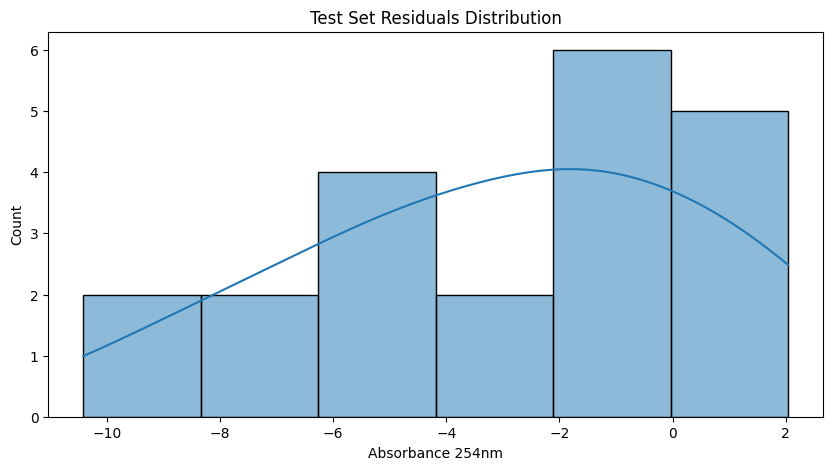

In [ ]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [ ]:
# get training residuals
train_predictions = np.array(
    [
        estimator.predict(X_train_fit, quantiles=0.5)
        for estimator in rf_ensemble["estimator"]
    ]
)
train_predictions = np.mean(train_predictions, axis=0)

train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted without feature names
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but RandomForestQuantileRegressor was fitted wit

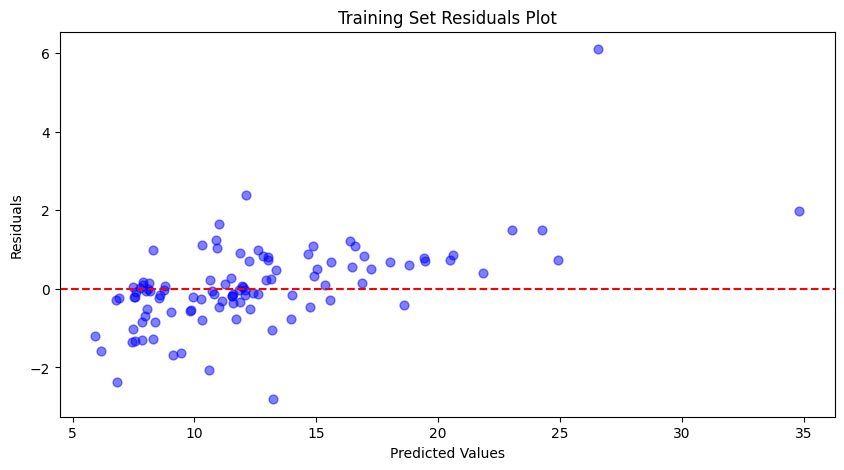

In [ ]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(train_predictions, train_residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

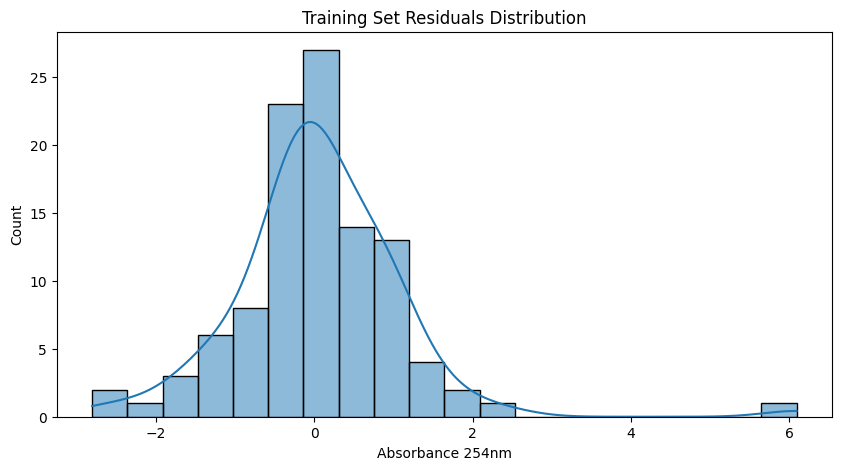

In [ ]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

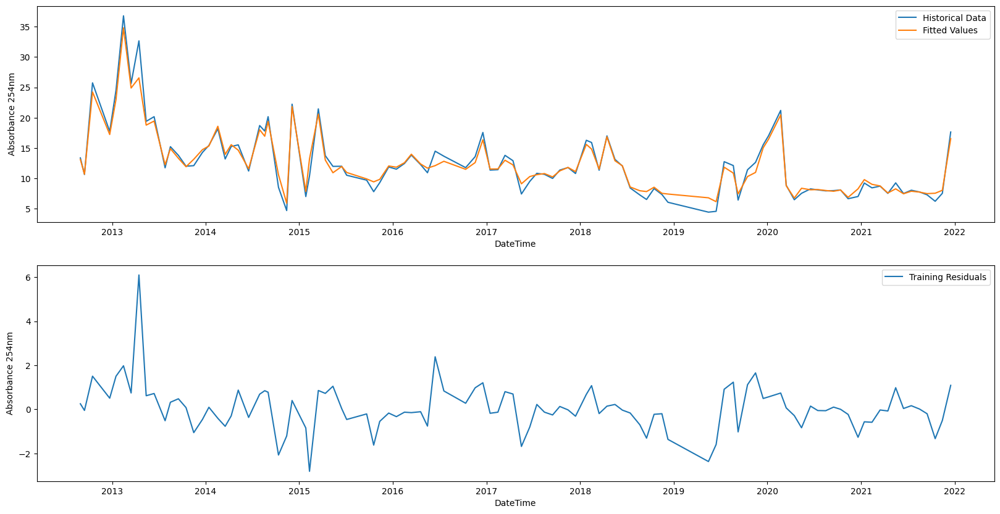

In [ ]:
# plot the time series of the residuals and of the train set
fig, ax = plt.subplots(2, 1, figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
    ax=ax[0],
)
sns.lineplot(
    x=y_train["DateTime"],
    y=train_predictions,
    label="Fitted Values",
    ax=ax[0],
)

sns.lineplot(
    x=y_train["DateTime"],
    y=train_residuals,
    label="Training Residuals",
    ax=ax[1],
)

plt.show()

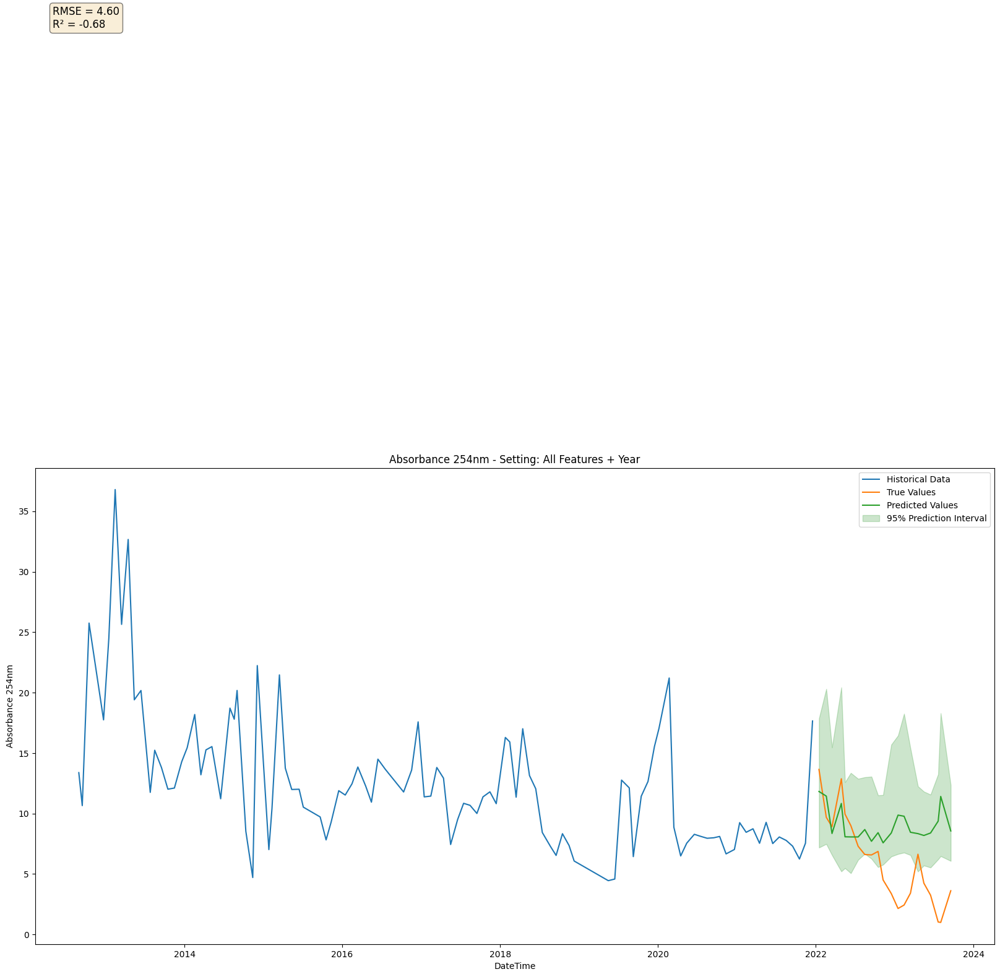

In [ ]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"], y=mean_predictions, label="Predicted Values"
)
# plot std of predictions
plt.fill_between(
    y_test["DateTime"],
    lower_bound_predictions,
    y2=upper_bound_predictions,
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    75,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Setting: {setting}")

plt.legend()
plt.show()

Comment: prevede un trend crescente, probabilmente dato da qualche feature 

### Store Results

In [ ]:
rf_pred = mean_predictions
rf_lower_bound = lower_bound_predictions
rf_upper_bound = upper_bound_predictions
rf_rmse = rmse
rf_r2 = r2

# XGBoost

### Split Data

In [76]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Season", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [77]:
# add polynomial features
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(2)

X_poly = poly.fit_transform(
    X[X.columns.difference(["DateTime"])]
)

X_poly = pd.DataFrame(
    X_poly,
    columns=poly.get_feature_names_out(
        X.columns.difference(["DateTime"])
    ),
)

X_poly["DateTime"] = X["DateTime"].values

# X_poly[further_features] = X[further_features].values

In [78]:
# split data such that 2022 and 2023 are test data
X_train = X_poly[X_poly["DateTime"] < "2021-01-01"]
X_test = X_poly[X_poly["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [79]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train[y_train.columns.difference(["DateTime"])]
y_test_fit = y_test[y_test.columns.difference(["DateTime"])]

In [80]:
# %%script false --no-raise-error
# split data such that 2022 and 2023 are test data
X_train = X[X['DateTime'] < '2021-01-01']
X_test = X[X['DateTime'] >= '2021-01-01']

y_train = y[y['DateTime'] < '2021-01-01']
y_test = y[y['DateTime'] >= '2021-01-01']

In [81]:
# %%script false --no-raise-error
X_train_fit = X_train[X_train.columns.difference(['DateTime'])]
X_test_fit = X_test[X_test.columns.difference(['DateTime'])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [82]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

#### Learning and Validation Curves

In [83]:
def learning_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    train_sizes=np.linspace(0.3, 1.0, 5),
):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator,
        X,
        y,
        train_sizes=train_sizes,
        cv=cv,
        scoring="neg_mean_squared_error",
    )

    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    validation_scores_mean = np.sqrt(
        -np.mean(validation_scores, axis=1)
    )
    validation_scores_std = np.sqrt(np.std(validation_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.plot(
        train_sizes,
        train_scores_mean,
        "o-",
        color="r",
        label="Training error",
    )
    plt.plot(
        train_sizes,
        validation_scores_mean,
        "o-",
        color="g",
        label="Validation error",
    )
    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes,
        validation_scores_mean - validation_scores_std,
        validation_scores_mean + validation_scores_std,
        alpha=0.1,
        color="g",
    )

    plt.rcParams["font.size"] = 10
    plt.ylabel("RMSE", fontsize=14)
    plt.xlabel("Training set size", fontsize=14)
    title = title
    plt.title(title, fontsize=18, y=1.03)
    plt.legend()
    plt.show()

In [84]:
def validation_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    param_name=None,
    param_range=None,
    fit_params=None,
):
    train_scores, test_scores = validation_curve(
        estimator,
        X,
        y,
        param_name=param_name,
        param_range=param_range,
        fit_params=fit_params,
        cv=cv,
        scoring="neg_mean_squared_error",  #'roc_auc'
        n_jobs=4,
    )
    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    test_scores_mean = np.sqrt(-np.mean(test_scores, axis=1))
    test_scores_std = np.sqrt(np.std(test_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.title(title, fontsize=20)
    plt.xlabel(param_name, fontsize=14)
    plt.ylabel("Score", fontsize=14)
    lw = 2
    plt.plot(
        param_range,
        train_scores_mean,
        label="Training score",
        color="darkorange",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.2,
        color="darkorange",
        lw=lw,
    )
    plt.plot(
        param_range,
        test_scores_mean,
        label="Cross-validation score",
        color="navy",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.2,
        color="navy",
        lw=lw,
    )
    plt.rcParams["font.size"] = 10
    plt.legend(loc="best")
    # plt.ylim(4, 8)
    plt.grid(visible=True)
    plt.show()

    # print param value with lowest test score
    print(
        f"{param_name} with lowest score:",
        param_range[np.argmin(test_scores_mean)],
    )

In [85]:
model = xgb.XGBRegressor(
    objective="reg:squarederror",
    booster="gblinear",
    random_state=42,
)

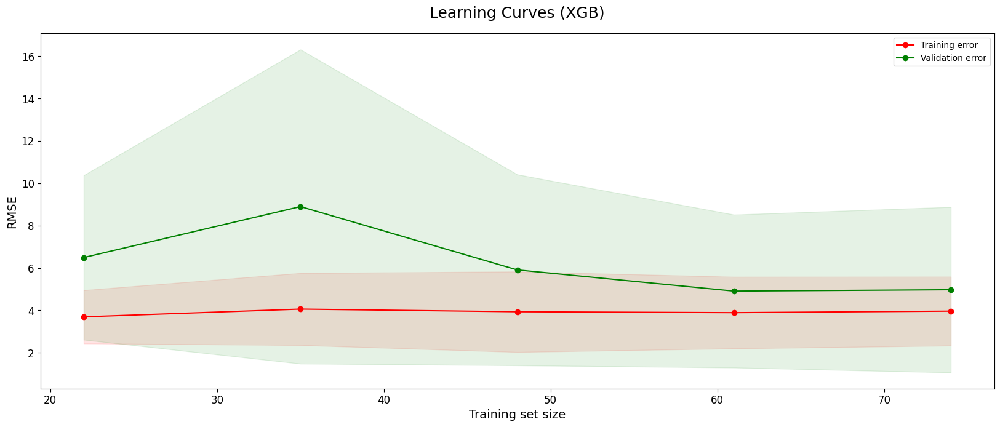

In [86]:
title = "Learning Curves (XGB)"
learning_curves(
    model, title, X_train_fit, y_train_fit["Absorbance 254nm"], cv=5
)

In [87]:
param_name = "n_estimators"
param_range = np.arange(1, 100, 5)

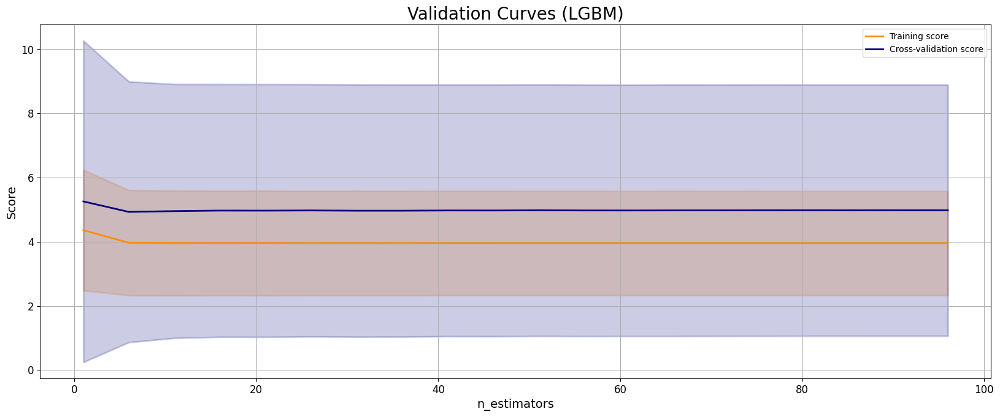

n_estimators with lowest score: 6


In [88]:
title = "Validation Curves (LGBM)"
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [89]:
param_name = "learning_rate"
param_range = np.logspace(-3, -1, 10)

In [90]:
np.logspace(-3, -1, 10)

array([0.001     , 0.0016681 , 0.00278256, 0.00464159, 0.00774264,
       0.0129155 , 0.02154435, 0.03593814, 0.05994843, 0.1       ])

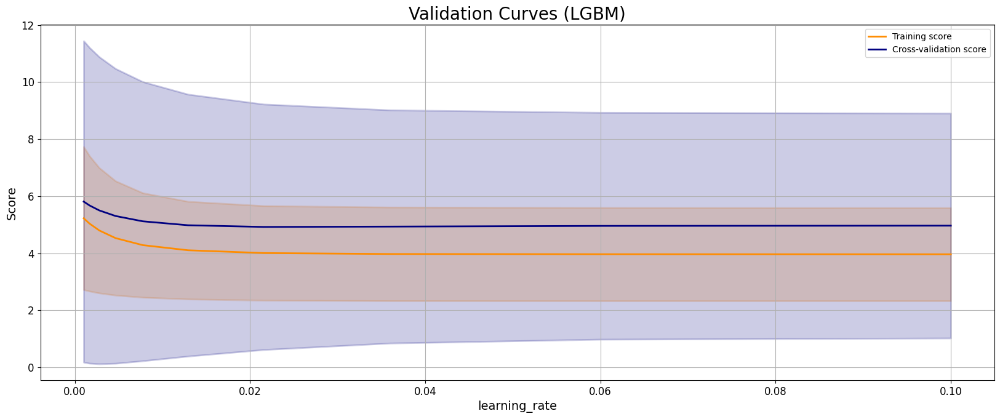

learning_rate with lowest score: 0.021544346900318832


In [91]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [92]:
param_name = "eta"
param_range = np.logspace(-5, 0, 10)

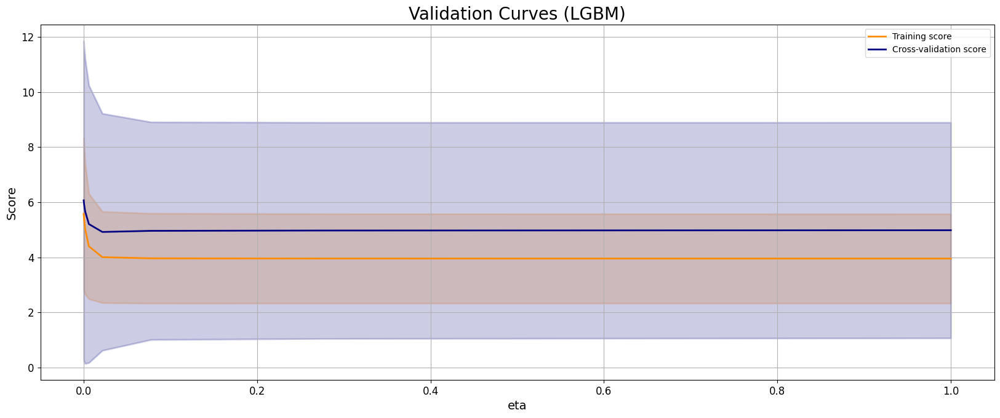

eta with lowest score: 0.021544346900318846


In [93]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [94]:
param_name = "reg_alpha"
param_range = np.logspace(-8, 0, 10)

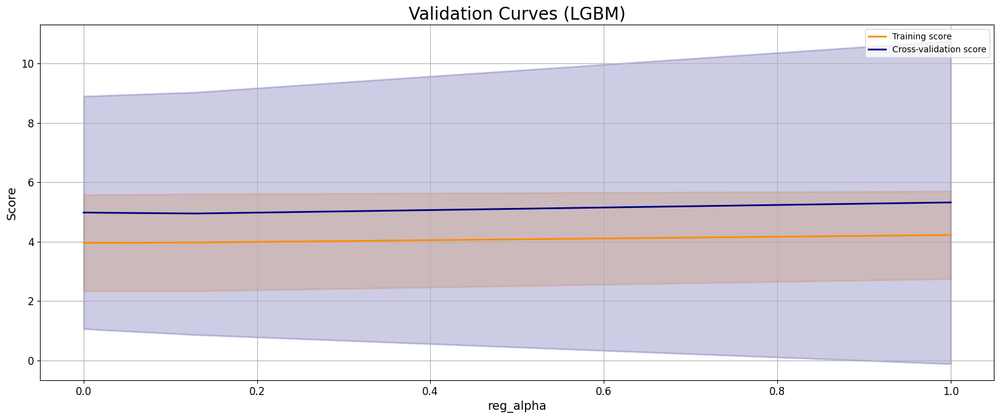

reg_alpha with lowest score: 0.12915496650148828


In [95]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [96]:
param_name = "reg_lambda"
param_range = np.logspace(-5, -1, 10)

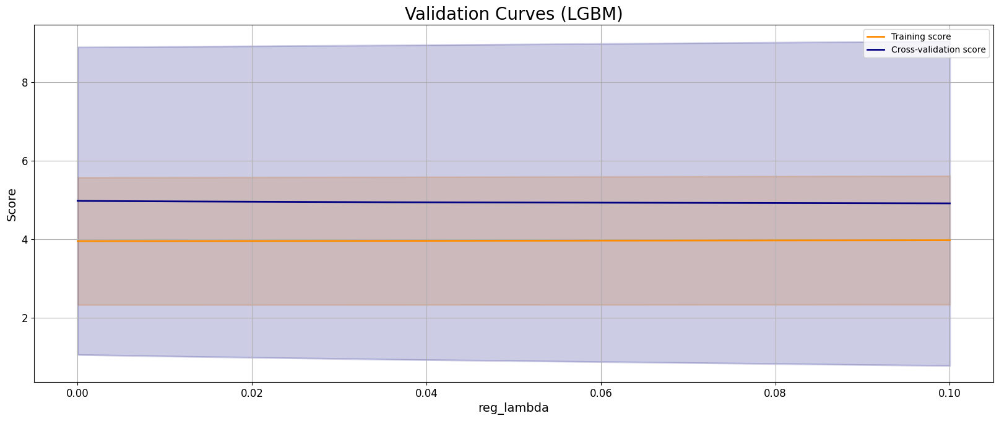

reg_lambda with lowest score: 0.1


In [97]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [98]:
param_name = "scale_pos_weight"
param_range = np.logspace(-5, 0, 10)

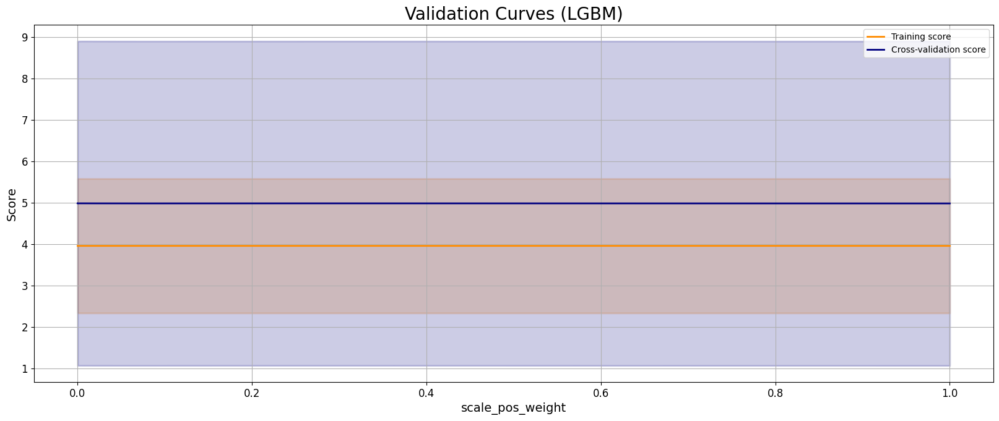

scale_pos_weight with lowest score: 1.0


In [99]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [100]:
param_name = "base_score"
param_range = np.linspace(0.1, 10, 10)

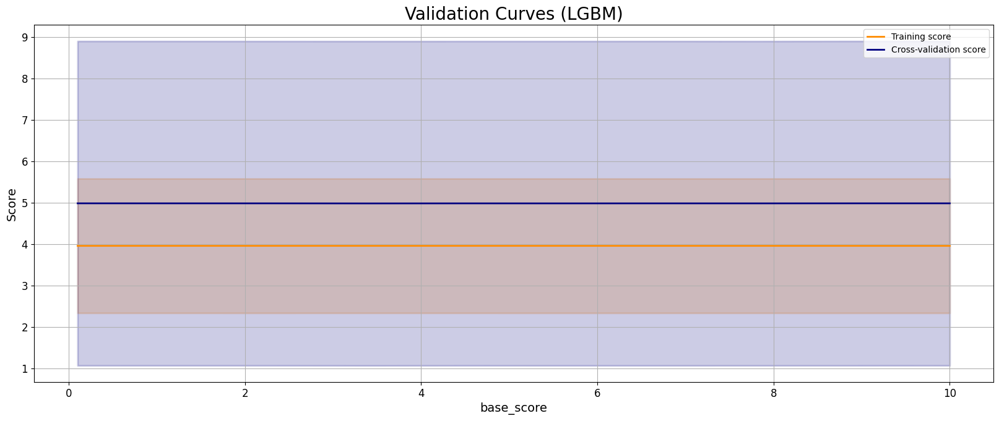

base_score with lowest score: 3.4000000000000004


In [101]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [102]:
param_name = "importance_type"
param_range = ["gain", "weight", "cover", "total_gain", "total_cover"]

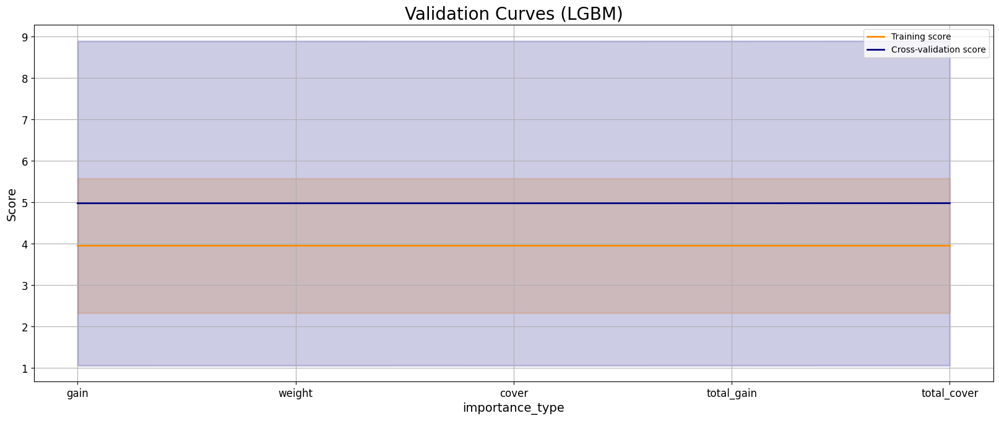

importance_type with lowest score: gain


In [103]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

#### Hyperparameter Tuning

In [104]:
def fit_and_validate_xgb_model(
    X,
    y,
    train_index,
    val_index,
    params,
):
    X_tr, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
    y_tr, y_val = y.iloc[train_index], y.iloc[val_index]

    model = xgb.XGBRegressor(random_state=42, **params)

    # train model
    _ = model.fit(X_tr, y_tr)

    # obtain predictions
    y_val_pred = model.predict(X_val)

    # return metrics
    return mean_squared_error(y_val, y_val_pred, squared=False)

In [105]:
def objective(trial: optuna.trial.Trial) -> float:
    eta = trial.suggest_float("eta", 1e-5, 1, log=True)
    reg_lambda = trial.suggest_float("reg_lambda", 1e-8, 1, log=True)
    reg_alpha = trial.suggest_float("reg_alpha", 1e-8, 1, log=True)
    learning_rate = trial.suggest_float(
        "learning_rate", 1e-5, 1, log=True
    )
    n_estimators = trial.suggest_int("n_estimators", 1, 500)
    updater = trial.suggest_categorical(
        "updater", ["shotgun", "coord_descent"]
    )

    params = {
        "objective": "reg:squarederror",
        "booster": "gblinear",
        "eta": eta,
        "reg_lambda": reg_lambda,
        "reg_alpha": reg_alpha,
        "learning_rate": learning_rate,
        "updater": updater,
        "n_estimators": n_estimators,
        "eval_metric": "rmse",
    }

    n_splits = 5
    cv = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    cv_mae = [None] * n_splits
    for i, (train_index, test_index) in enumerate(
        cv.split(X_train_fit, y_train_fit["Absorbance 254nm"])
    ):
        cv_mae[i] = fit_and_validate_xgb_model(
            X_train_fit,
            y_train_fit["Absorbance 254nm"],
            train_index,
            test_index,
            params,
        )

    # saving the individual fold holdout metrics
    # uncomment this line if you don't want this
    trial.set_user_attr("split_mae", cv_mae)

    return np.mean(cv_mae)

In [106]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///XGBoost.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(
    objective,
    n_trials=200,
    show_progress_bar=True,
)

[I 2024-04-16 22:24:49,609] Using an existing study with name 'Hyperparameter Tuning - All Features + ['Year']' instead of creating a new one.


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2024-04-16 22:24:49,895] Trial 226 finished with value: 4.2808082403595105 and parameters: {'eta': 0.05028459505021461, 'reg_lambda': 1.475038322310235e-05, 'reg_alpha': 0.25567772575426184, 'learning_rate': 0.5224479390445874, 'n_estimators': 357, 'updater': 'shotgun'}. Best is trial 226 with value: 4.2808082403595105.
[I 2024-04-16 22:24:50,082] Trial 227 finished with value: 4.281558839298961 and parameters: {'eta': 0.041307198281307224, 'reg_lambda': 1.492736787255197e-05, 'reg_alpha': 0.2669223142082029, 'learning_rate': 0.5313733124864132, 'n_estimators': 477, 'updater': 'shotgun'}. Best is trial 226 with value: 4.2808082403595105.
[I 2024-04-16 22:24:50,265] Trial 228 finished with value: 4.289072843953954 and parameters: {'eta': 0.03040716699604662, 'reg_lambda': 2.7575914594898205e-05, 'reg_alpha': 0.14908755548229172, 'learning_rate': 0.2945113190604154, 'n_estimators': 361, 'updater': 'shotgun'}. Best is trial 226 with value: 4.2808082403595105.
[I 2024-04-16 22:24:50,444

KeyboardInterrupt: 

In [107]:
study.best_params

{'eta': 0.05028459505021461,
 'reg_lambda': 1.475038322310235e-05,
 'reg_alpha': 0.25567772575426184,
 'learning_rate': 0.5224479390445874,
 'n_estimators': 357,
 'updater': 'shotgun'}

In [108]:
params = study.best_params
params["objective"] = "reg:squarederror"
params["booster"] = "gblinear"

In [109]:
# params['n_estimators'] = 150
# params['learning_rate'] = 0.3

In [110]:
param = {}
param["objective"] = "reg:squarederror"
param["booster"] = "gblinear"
param["n_estimators"] = 10
param["learning_rate"] = 0.5

In [111]:
booster = xgb.XGBRegressor(
    random_state=42,
    **params,
)

booster.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

XGBRegressor(base_score=None, booster='gblinear', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.05028459505021461,
             eval_metric=None, feature_types=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.5224479390445874, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=357, n_jobs=None,
             num_parallel_tree=None, ...)

### Feature Importance

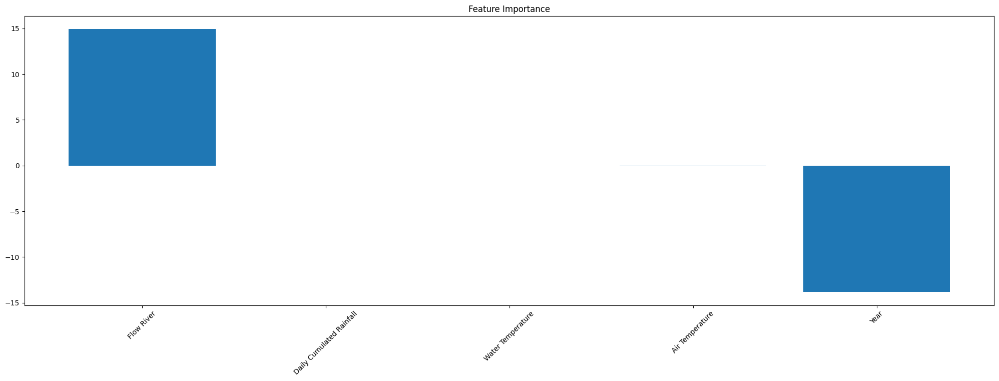

In [112]:
# show the importance of each feature in the model
feature_importance = pd.DataFrame()
feature_importance["feature"] = booster.feature_names_in_
feature_importance["importance"] = booster.feature_importances_

feature_importance = feature_importance.sort_values(
    by="importance", ascending=False
)

# plot the importance of each feature
plt.figure(figsize=(25, 7.5))
plt.bar(
    x=feature_importance["feature"],
    height=feature_importance["importance"],
)

# rotate the x axis words by 45°
plt.xticks(rotation=45)

plt.title("Feature Importance")
plt.show()

### Predictions

In [113]:
mapie_cqr = MapieRegressor(booster, method='naive', random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MapieRegressor(estimator=XGBRegressor(base_score=None, booster='gblinear',
                                      callbacks=None, colsample_bylevel=None,
                                      colsample_bynode=None,
                                      colsample_bytree=None, device=None,
                                      early_stopping_rounds=None,
                                      enable_categorical=False,
                                      eta=0.05028459505021461, eval_metric=None,
                                      feature_types=None, gamma=None,
                                      grow_policy=None, importance_type=None,
                                      interaction_constraints=None,
                                      learning_rate=0.5224479390445874,
                                      max_bin=None, max_cat_threshold=None,
                                      max_cat_to_onehot=None,
                                      max_delta_step=None, max_depth=None,
                                      max_leaves=None, min_child_weight=None,
                                      missing=nan, monotone_constraints=None,
                                      multi_strategy=None, n_estimators=357,
                                      n_jobs=None, num_parallel_tree=None, ...),
               method='naive', random_state=42)

In [114]:
alpha = 0.05

# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


In [115]:
print(f"Coverage: {coverage_cqr}")

Coverage: 1.0


#### Compute Measures

In [116]:
def nse(predictions, targets):
    return (1-(np.sum((targets-predictions)**2)/np.sum((targets-np.mean(targets))**2)))

In [117]:
from sklearn.metrics import mean_absolute_error


rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

mae = mean_absolute_error(y_test_fit["Absorbance 254nm"], y_med)

nseff = nse(y_med, y_test_fit["Absorbance 254nm"])

print(f"RMSE: {rmse:.2f}")
print(f"R\u00b2: {r2:.2f}")
print(f"MAE: {mae:.2f}")
print(f"NSE: {nseff:.2f}")

RMSE: 2.76
R²: 0.39
MAE: 2.17
NSE: 0.39


### Plots

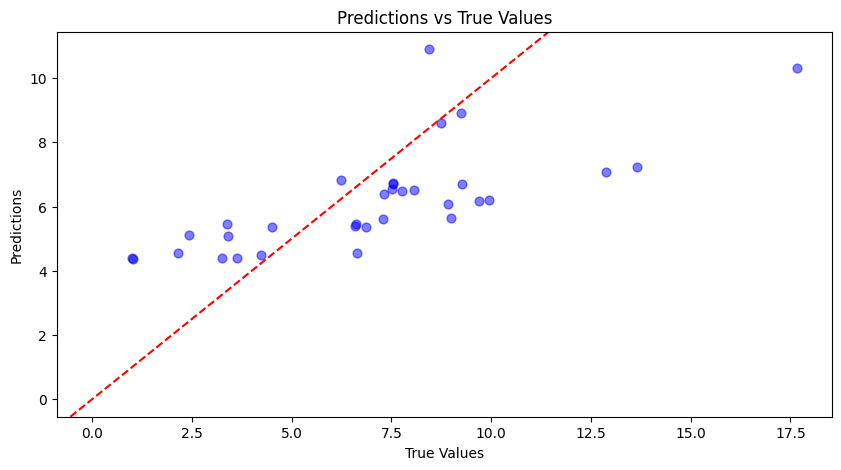

In [118]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

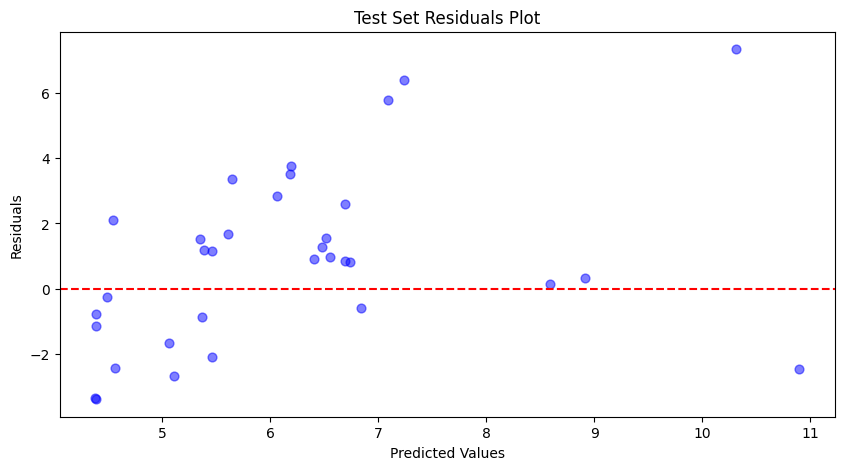

In [119]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

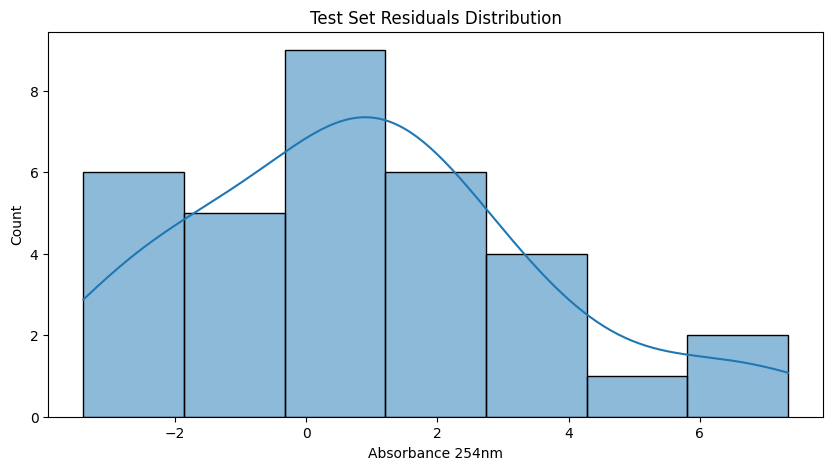

In [120]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [121]:
# get training residuals
train_predictions = booster.predict(X_train_fit)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

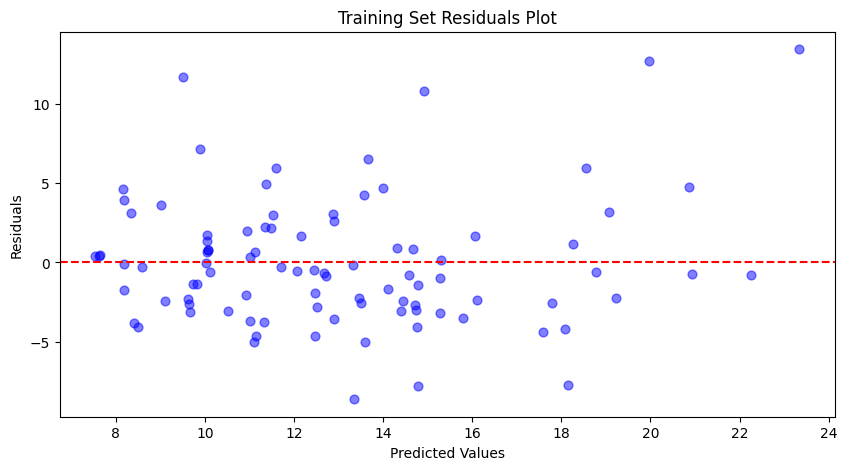

In [122]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(train_predictions, train_residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

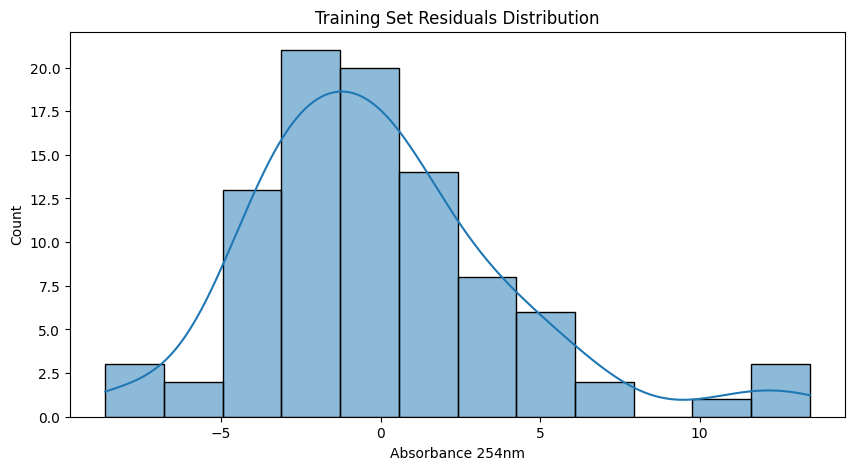

In [123]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

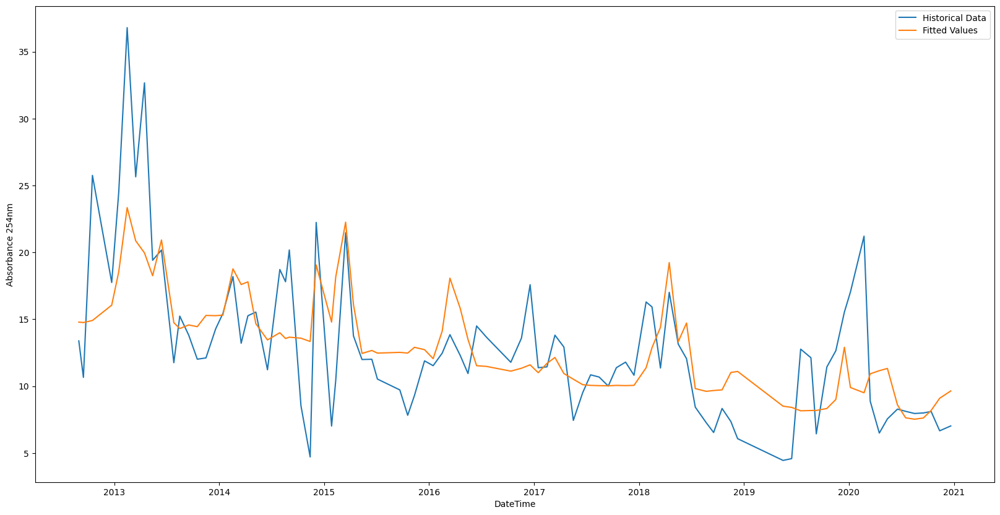

In [124]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"], y=train_predictions, label="Fitted Values"
)

plt.show()

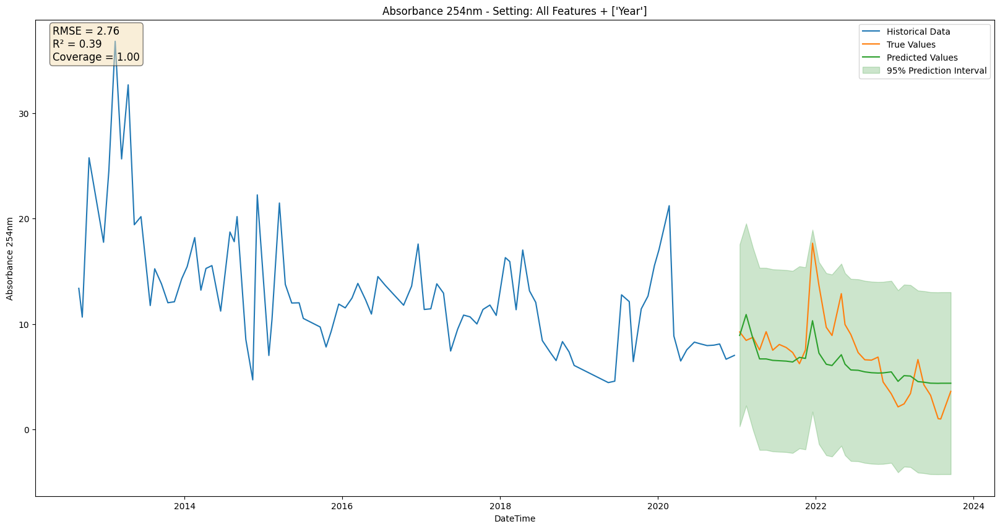

In [125]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(x=y_test["DateTime"], y=y_med, label="Predicted Values")
# plot std of predictions
plt.fill_between(
    y_test["DateTime"],
    y_lower,
    y2=y_upper,
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

Comment: prevede un trend crescente, probabilmente dato da qualche feature 

### Store Results

In [127]:
boost_pred = y_med
boost_lower_bound = y_lower
boost_upper_bound = y_upper
boost_rmse = rmse
boost_r2 = r2
boost_mae = mae
boost_nse = nseff
boost_coverage = coverage_cqr

# LightGBM (Random Forest with Linear Regressors on leaves)

### Split Data

In [128]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Season", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [129]:
# add polynomial features
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(2)

X_poly = poly.fit_transform(
    X[X.columns.difference(["DateTime"])]
)

X_poly = pd.DataFrame(
    X_poly,
    columns=poly.get_feature_names_out(
        X.columns.difference(["DateTime"])
    ),
)

X_poly["DateTime"] = X["DateTime"].values

In [130]:
# split data such that 2022 and 2023 are test data
X_train = X_poly[X_poly["DateTime"] < "2021-01-01"]
X_test = X_poly[X_poly["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [131]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [132]:
# %%script false --no-raise-error
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2021-01-01"]
X_test = X[X["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [133]:
# %%script false --no-raise-error
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [134]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

### Train Model

#### Learning and Validation Curves

In [135]:
def learning_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    train_sizes=np.linspace(0.3, 1.0, 5),
):
    train_sizes, train_scores, validation_scores = learning_curve(
        estimator,
        X,
        y,
        train_sizes=train_sizes,
        cv=cv,
        scoring="neg_mean_squared_error",
    )

    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    validation_scores_mean = np.sqrt(
        -np.mean(validation_scores, axis=1)
    )
    validation_scores_std = np.sqrt(np.std(validation_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.plot(
        train_sizes,
        train_scores_mean,
        "o-",
        color="r",
        label="Training error",
    )
    plt.plot(
        train_sizes,
        validation_scores_mean,
        "o-",
        color="g",
        label="Validation error",
    )
    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes,
        validation_scores_mean - validation_scores_std,
        validation_scores_mean + validation_scores_std,
        alpha=0.1,
        color="g",
    )

    plt.rcParams["font.size"] = 10
    plt.ylabel("RMSE", fontsize=14)
    plt.xlabel("Training set size", fontsize=14)
    title = title
    plt.title(title, fontsize=18, y=1.03)
    plt.legend()
    plt.show()

In [136]:
def validation_curves(
    estimator,
    title,
    X,
    y,
    cv=None,
    param_name=None,
    param_range=None,
    fit_params=None,
):
    train_scores, test_scores = validation_curve(
        estimator,
        X,
        y,
        param_name=param_name,
        param_range=param_range,
        fit_params=fit_params,
        cv=cv,
        scoring="neg_mean_squared_error",  #'roc_auc'
        n_jobs=4,
    )
    train_scores_mean = np.sqrt(-np.mean(train_scores, axis=1))
    train_scores_std = np.sqrt(np.std(train_scores, axis=1))
    test_scores_mean = np.sqrt(-np.mean(test_scores, axis=1))
    test_scores_std = np.sqrt(np.std(test_scores, axis=1))

    plt.rcParams["font.size"] = 12
    plt.figure(figsize=(20, 7.5))
    plt.title(title, fontsize=20)
    plt.xlabel(param_name, fontsize=14)
    plt.ylabel("Score", fontsize=14)
    lw = 2
    plt.plot(
        param_range,
        train_scores_mean,
        label="Training score",
        color="darkorange",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.2,
        color="darkorange",
        lw=lw,
    )
    plt.plot(
        param_range,
        test_scores_mean,
        label="Cross-validation score",
        color="navy",
        lw=lw,
    )
    plt.fill_between(
        param_range,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.2,
        color="navy",
        lw=lw,
    )
    plt.rcParams["font.size"] = 10
    plt.legend(loc="best")
    # plt.ylim(4, 8)
    plt.grid(visible=True)
    plt.show()

    # print param value with lowest test score
    print(
        f"{param_name} with lowest score:",
        param_range[np.argmin(test_scores_mean)],
    )

In [137]:
params_lgb = {
    "objective": "regression",
    "linear_tree": True,
    "random_state": 42,
}

In [138]:
model = LGBMRegressor(**params_lgb)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 22, number of used features: 0
[LightGBM] [Info] Start training from score 12.915934
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

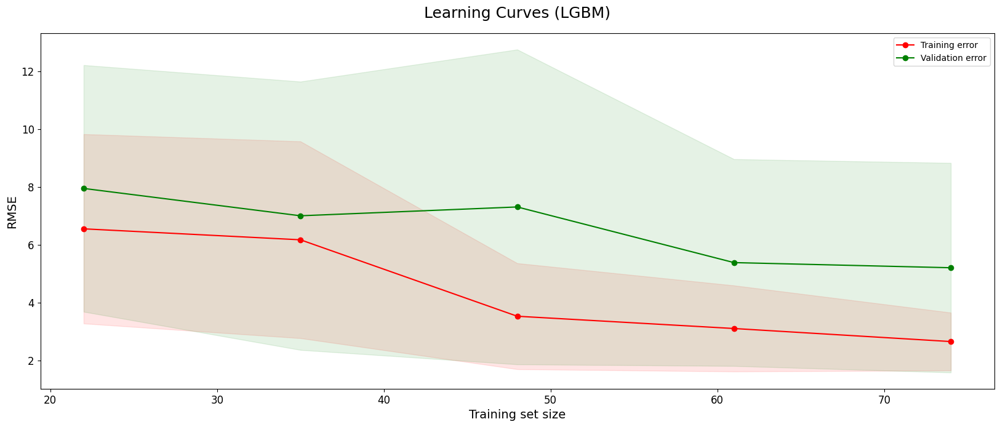

In [139]:
title = "Learning Curves (LGBM)"
learning_curves(
    model, title, X_train_fit, y_train_fit["Absorbance 254nm"], cv=5
)

In [140]:
param_name = "n_estimators"
param_range = np.arange(1, 100, 5)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[Light

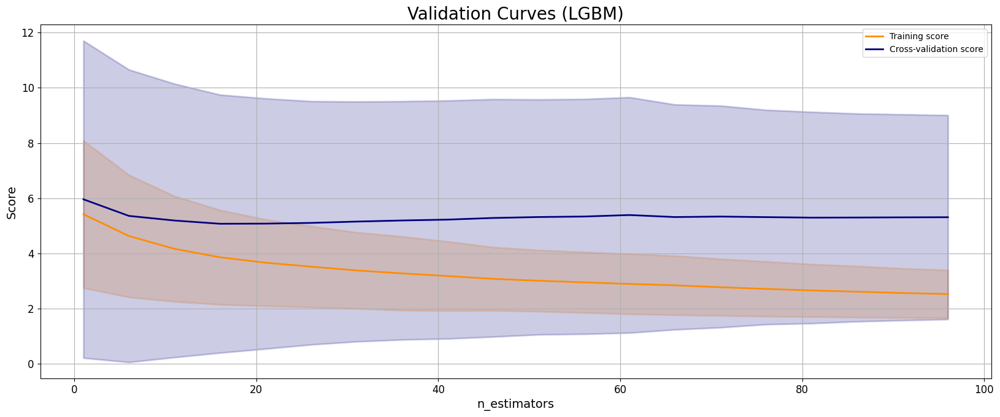

n_estimators with lowest score: 16


In [ ]:
title = "Validation Curves (LGBM)"
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [ ]:
param_name = "learning_rate"
param_range = np.logspace(-3, -1, 10)

In [ ]:
np.logspace(-3, -1, 10)

array([0.001     , 0.0016681 , 0.00278256, 0.00464159, 0.00774264,
       0.0129155 , 0.02154435, 0.03593814, 0.05994843, 0.1       ])

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Warning] No further splits with positive gain, best gain

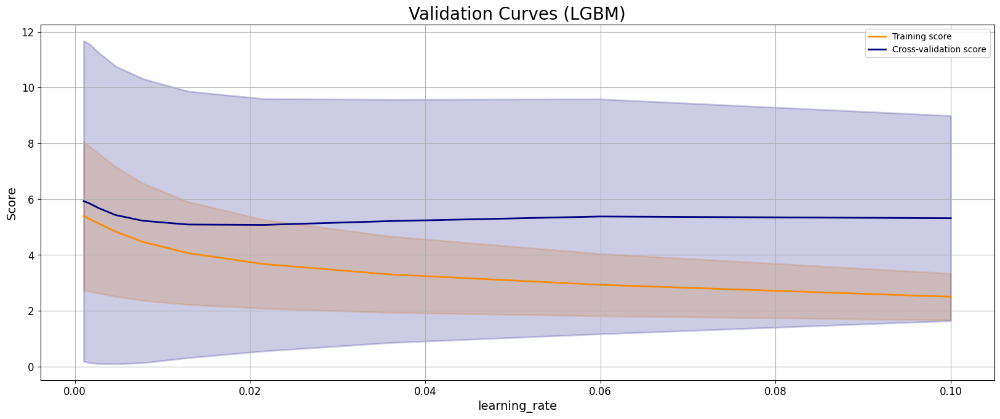

learning_rate with lowest score: 0.021544346900318832


In [ ]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [ ]:
param_name = "num_leaves"
param_range = np.arange(2, 50, 2)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Wa

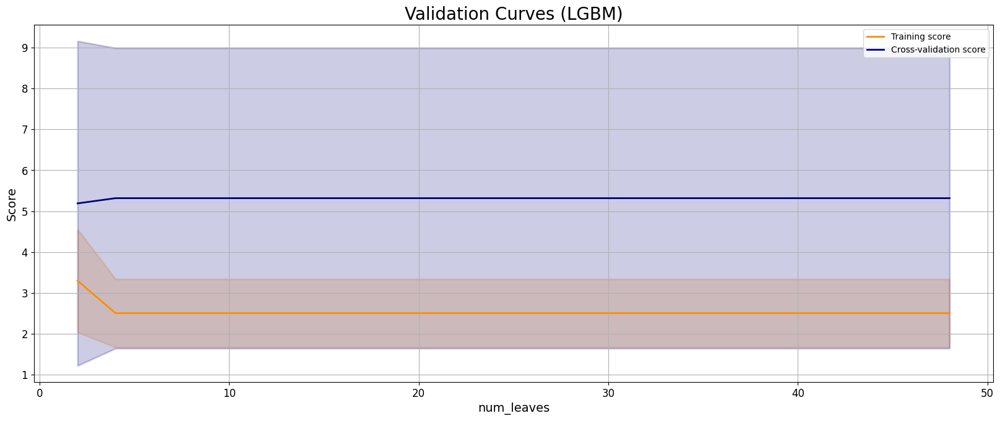

num_leaves with lowest score: 2


In [ ]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [ ]:
param_name = "lambda_l1"
param_range = np.logspace(-5, -1, 10)

[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=1e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

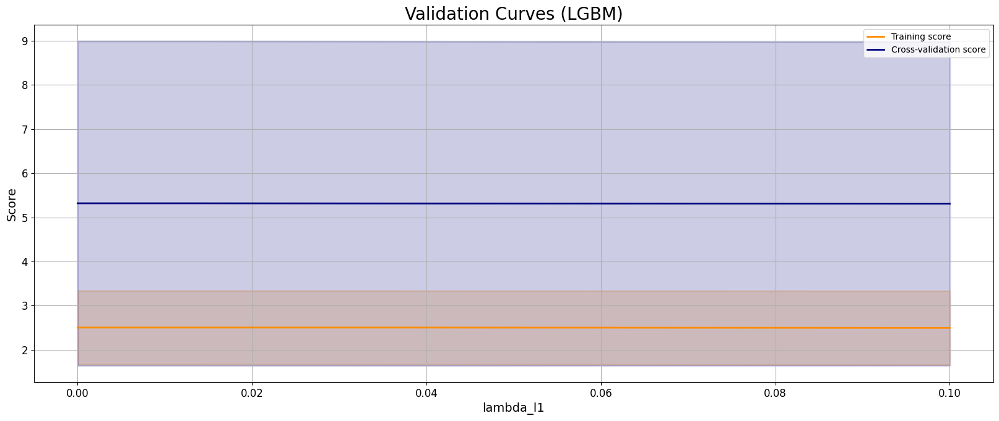

lambda_l1 with lowest score: 0.1


In [ ]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [ ]:
param_name = "lambda_l2"
param_range = np.logspace(-5, -1, 10)

[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=1e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

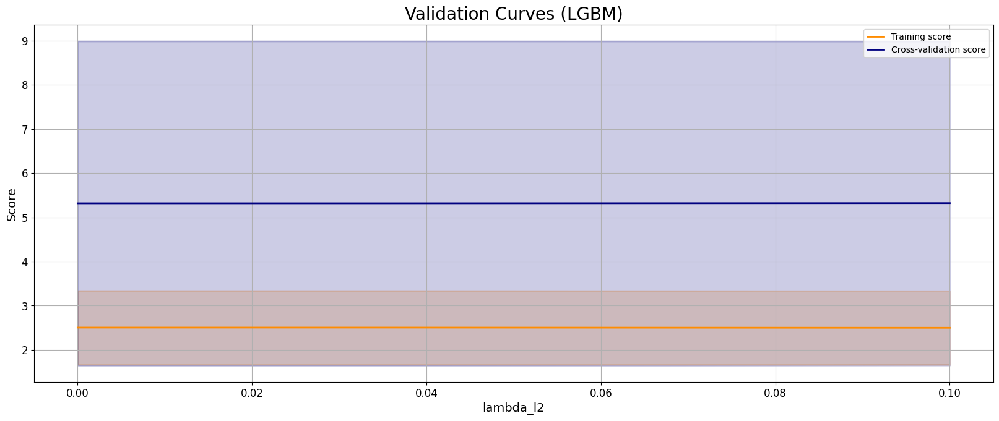

lambda_l2 with lowest score: 1e-05


In [ ]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [ ]:
param_name = "max_depth"
param_range = np.arange(2, 20, 1)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000225 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_col_

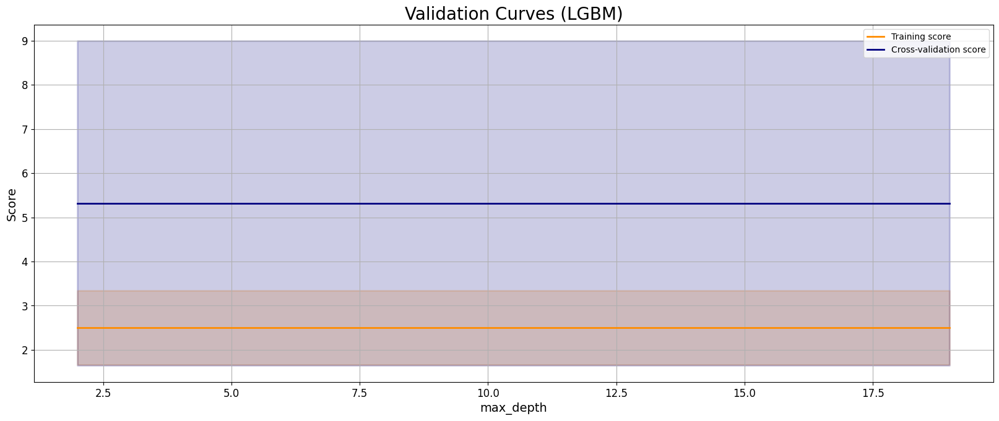

max_depth with lowest score: 2


In [ ]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

In [ ]:
param_name = "max_bin"
param_range = np.arange(2, 255, 5)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000878 seconds.
You can set `force_col_wise=true` to remove the overhead.[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_col_wise=true` to remove the overhead.

[LightGBM] [Info] Total Bins 12[LightGBM] [Info] Total Bins 42

[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Number of data points in the train set: 74, number of used features: 6
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Info] Start training from score 11.479711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

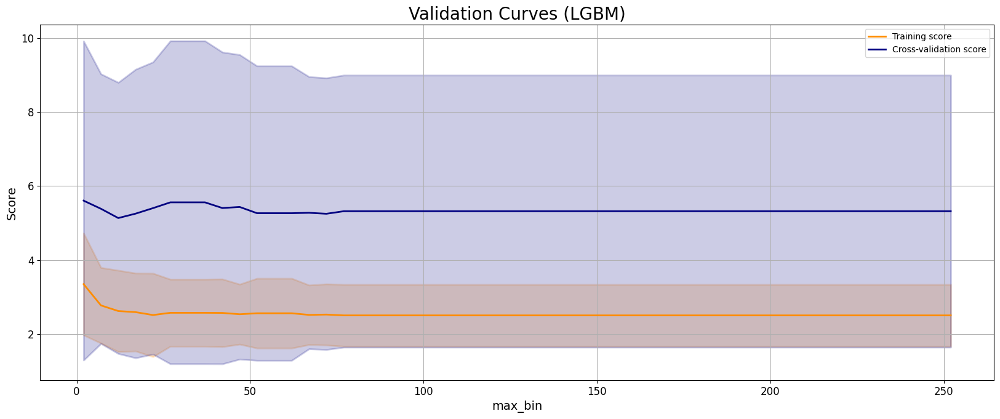

max_bin with lowest score: 12


In [ ]:
validation_curves(
    model,
    title,
    X_train_fit,
    y_train_fit["Absorbance 254nm"],
    cv=5,
    param_name=param_name,
    param_range=param_range,
)

#### Hyperparameter Tuning

In [141]:
def fit_and_validate_lgbm_model(
    X,
    y,
    train_index,
    val_index,
    params,
):
    X_tr, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
    y_tr, y_val = y.iloc[train_index], y.iloc[val_index]

    model = LGBMRegressor(
        objective="regression",
        random_state=42,
        linear_tree=True,
    )

    if params is not None:
        model.set_params(**params)

    # train model
    _ = model.fit(X_tr, y_tr)

    # obtain predictions
    y_val_pred = model.predict(X_val)

    # return metrics
    return mean_squared_error(y_val, y_val_pred, squared=False)

In [142]:
def objective(trial: optuna.trial.Trial) -> float:
    config = {
        "n_estimators": trial.suggest_int(
            "n_estimators", 1, 20, step=1
        ),
        "learning_rate": trial.suggest_float(
            "learning_rate", 1e-3, 1, log=True
        ),
        "max_depth": trial.suggest_int("max_depth", 2, 16, step=1),
        "num_leaves": trial.suggest_int("num_leaves", 2, 20, step=1),
        "min_data_in_leaf": trial.suggest_int(
            "min_data_in_leaf", 2, 50, step=1
        ),
        "lambda_l1": trial.suggest_float(
            "lambda_l1", 1e-3, 10, log=True
        ),
        "lambda_l2": trial.suggest_float(
            "lambda_l2", 1e-3, 10, log=True
        ),
        "min_split_gain": trial.suggest_float(
            "min_split_gain", 0, 15, step=0.5
        ),
        "subsample": trial.suggest_float("subsample", 0.1, 1),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 1e-3, 1, log=True
        ),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 1e-3, 1, log=True
        ),
        "min_child_samples": trial.suggest_int(
            "min_child_samples", 20, 1000, log=True
        ),
        "max_bin": trial.suggest_int("max_bin", 10, 500, step=10),
    }

    n_splits = 5
    cv = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    cv_mae = [None] * n_splits
    for i, (train_index, test_index) in enumerate(
        cv.split(X_train_fit, y_train_fit["Absorbance 254nm"])
    ):
        cv_mae[i] = fit_and_validate_lgbm_model(
            X_train_fit,
            y_train_fit["Absorbance 254nm"],
            train_index,
            test_index,
            config,
        )

    # saving the individual fold holdout metrics
    # uncomment this line if you don't want this
    trial.set_user_attr("split_mae", cv_mae)

    return np.mean(cv_mae)

In [143]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///LGBM.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(objective, n_trials=400, show_progress_bar=True)

[I 2024-04-16 22:25:54,532] Using an existing study with name 'Hyperparameter Tuning - All Features + ['Year']' instead of creating a new one.


  0%|          | 0/400 [00:00<?, ?it/s]

[LightGBM] [Warning] lambda_l1 is set=0.27772473124519925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27772473124519925
[LightGBM] [Warning] lambda_l2 is set=0.017257535155138642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017257535155138642
[LightGBM] [Warning] bagging_fraction is set=0.016441891419092188, subsample=0.5449488250274916 will be ignored. Current value: bagging_fraction=0.016441891419092188
[LightGBM] [Warning] min_data_in_leaf is set=41, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=41
[LightGBM] [Warning] feature_fraction is set=0.0016056471854772574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.0016056471854772574
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Found whitespace in feature_names, repla

KeyboardInterrupt: 

In [145]:
study.best_params

{'n_estimators': 16,
 'learning_rate': 0.6192800859019298,
 'max_depth': 16,
 'num_leaves': 20,
 'min_data_in_leaf': 34,
 'lambda_l1': 1.8585248563175933,
 'lambda_l2': 0.020368547806226774,
 'min_split_gain': 2.5,
 'subsample': 0.5639096844841955,
 'bagging_fraction': 0.026474369917739878,
 'feature_fraction': 0.0012608584366219668,
 'min_child_samples': 33,
 'max_bin': 20}

In [146]:
params = study.best_params

# params['n_estimators'] = 10
# params["max_bin"] = 30
params["learning_rate"] = 0.6
# params['lambda_l2'] = 1

In [148]:
# %%script false --no-raise-error
params = {
    'n_estimators': 16,
    'learning_rate': 0.6192800859019298,
    'max_depth': 16,
    'num_leaves': 20,
    'min_data_in_leaf': 34,
    'lambda_l1': 1.8585248563175933,
    'lambda_l2': 0.020368547806226774,
    'min_split_gain': 2.5,
    'subsample': 0.5639096844841955,
    'bagging_fraction': 0.026474369917739878,
    'feature_fraction': 0.0012608584366219668,
    'min_child_samples': 33,
    'max_bin': 20
}

#### Train model with mapie

In [149]:
alpha = 0.1
estimator = LGBMRegressor(
    objective="regression", random_state=42, linear_tree=True, **params
)

estimator.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

[LightGBM] [Warning] lambda_l1 is set=1.8585248563175933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8585248563175933
[LightGBM] [Warning] lambda_l2 is set=0.020368547806226774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020368547806226774
[LightGBM] [Warning] bagging_fraction is set=0.026474369917739878, subsample=0.5639096844841955 will be ignored. Current value: bagging_fraction=0.026474369917739878
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.0012608584366219668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.0012608584366219668
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=1.8585248563175933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8585248563175933
[LightGBM] [Warning] lambda_l2 is set=0.020368547806226774, reg_lamb

LGBMRegressor(bagging_fraction=0.026474369917739878,
              feature_fraction=0.0012608584366219668,
              lambda_l1=1.8585248563175933, lambda_l2=0.020368547806226774,
              learning_rate=0.6192800859019298, linear_tree=True, max_bin=20,
              max_depth=16, min_child_samples=33, min_data_in_leaf=34,
              min_split_gain=2.5, n_estimators=16, num_leaves=20,
              objective='regression', random_state=42,
              subsample=0.5639096844841955)

In [150]:
# Calibrate uncertainties on calibration set
mapie_cqr = MapieRegressor(estimator, cv="prefit", random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

[LightGBM] [Warning] lambda_l1 is set=1.8585248563175933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8585248563175933
[LightGBM] [Warning] lambda_l2 is set=0.020368547806226774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020368547806226774
[LightGBM] [Warning] bagging_fraction is set=0.026474369917739878, subsample=0.5639096844841955 will be ignored. Current value: bagging_fraction=0.026474369917739878
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.0012608584366219668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.0012608584366219668


MapieRegressor(cv='prefit',
               estimator=LGBMRegressor(bagging_fraction=0.026474369917739878,
                                       feature_fraction=0.0012608584366219668,
                                       lambda_l1=1.8585248563175933,
                                       lambda_l2=0.020368547806226774,
                                       learning_rate=0.6192800859019298,
                                       linear_tree=True, max_bin=20,
                                       max_depth=16, min_child_samples=33,
                                       min_data_in_leaf=34, min_split_gain=2.5,
                                       n_estimators=16, num_leaves=20,
                                       objective='regression', random_state=42,
                                       subsample=0.5639096844841955),
               method='base', random_state=42)

### Feature Importance

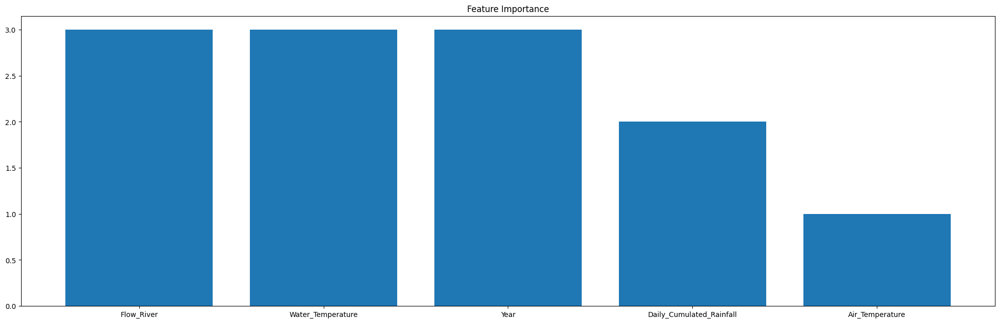

In [151]:
# show the importance of each feature in the model
feature_importance = pd.DataFrame()
feature_importance["feature"] = estimator.feature_name_
feature_importance["importance"] = estimator.feature_importances_

feature_importance = feature_importance.sort_values(
    by="importance", ascending=False
)

# plot the importance of each feature
plt.figure(figsize=(25, 7.5))
plt.bar(
    x=feature_importance["feature"],
    height=feature_importance["importance"],
)
plt.title("Feature Importance")
plt.show()

### Predictions

In [152]:
# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

[LightGBM] [Warning] lambda_l1 is set=1.8585248563175933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8585248563175933
[LightGBM] [Warning] lambda_l2 is set=0.020368547806226774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020368547806226774
[LightGBM] [Warning] bagging_fraction is set=0.026474369917739878, subsample=0.5639096844841955 will be ignored. Current value: bagging_fraction=0.026474369917739878
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.0012608584366219668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.0012608584366219668


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


In [153]:
print("Coverage:", coverage_cqr)

Coverage: 0.9696969696969697


#### Compute Measures

In [154]:
rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

mae = mean_absolute_error(y_test_fit["Absorbance 254nm"], y_med)

nseff = nse(y_med, y_test_fit["Absorbance 254nm"])

print(f"RMSE: {rmse:.2f}")
print(f"R\u00b2: {r2:.2f}")
print(f"MAE: {mae:.2f}")
print(f"NSE: {nseff:.2f}")

RMSE: 2.89
R²: 0.34
MAE: 2.26
NSE: 0.34


### Plots

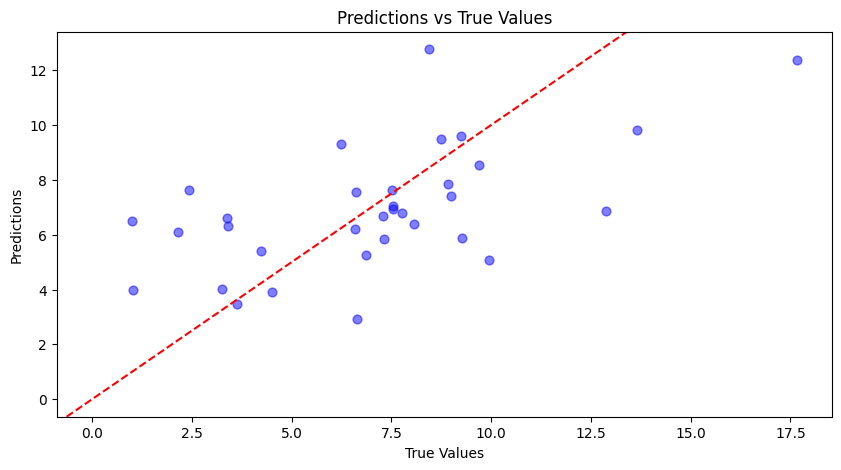

In [155]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

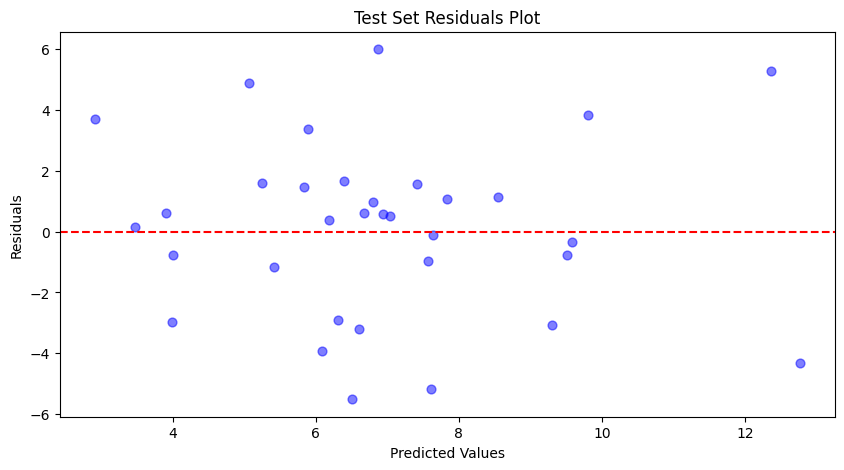

In [156]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

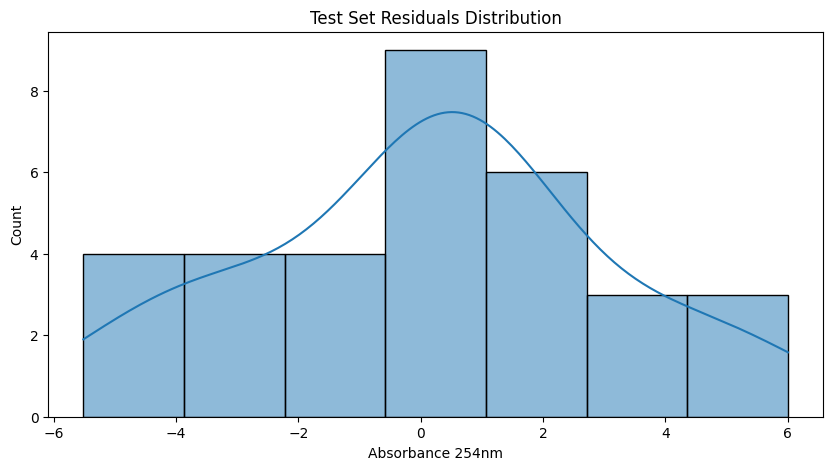

In [157]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [158]:
# get training residuals
train_predictions, _ = mapie_cqr.predict(X_train_fit, alpha=alpha)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

[LightGBM] [Warning] lambda_l1 is set=1.8585248563175933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8585248563175933
[LightGBM] [Warning] lambda_l2 is set=0.020368547806226774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020368547806226774
[LightGBM] [Warning] bagging_fraction is set=0.026474369917739878, subsample=0.5639096844841955 will be ignored. Current value: bagging_fraction=0.026474369917739878
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] feature_fraction is set=0.0012608584366219668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.0012608584366219668


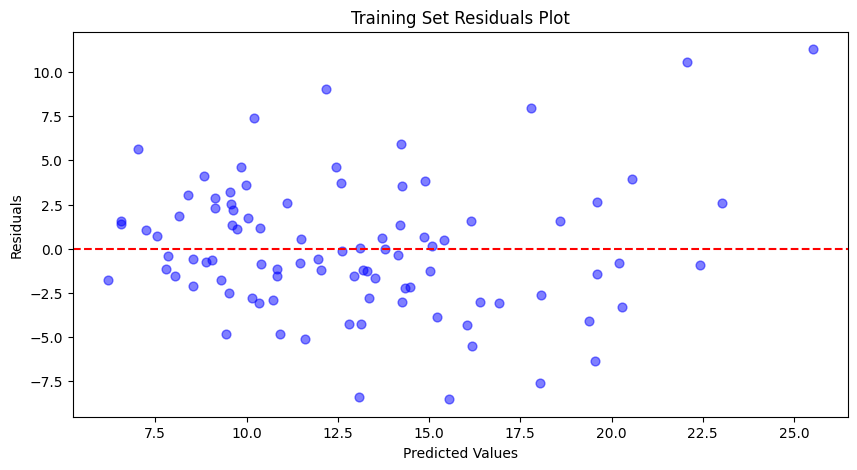

In [159]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(train_predictions, train_residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

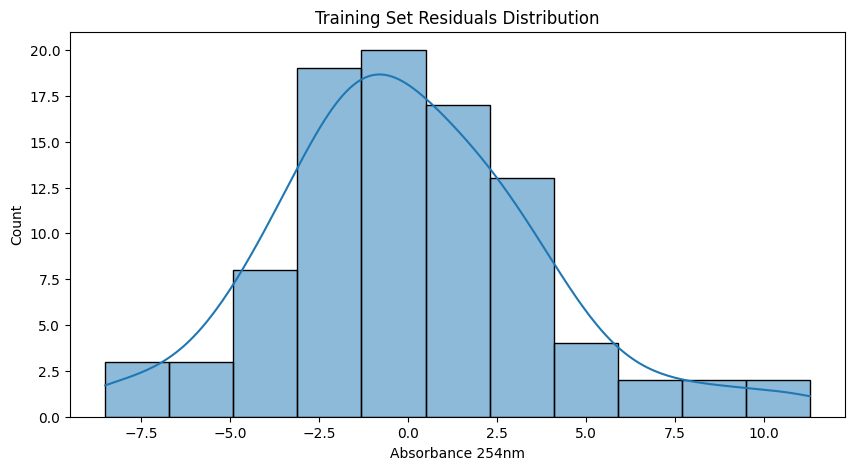

In [160]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

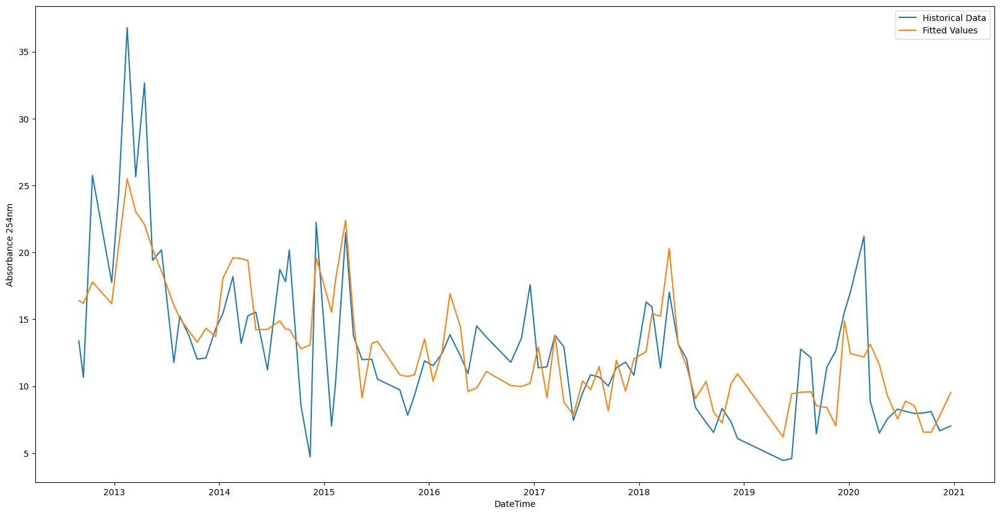

In [161]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train["DateTime"],
    y=train_predictions,
    label="Fitted Values",
)

plt.show()

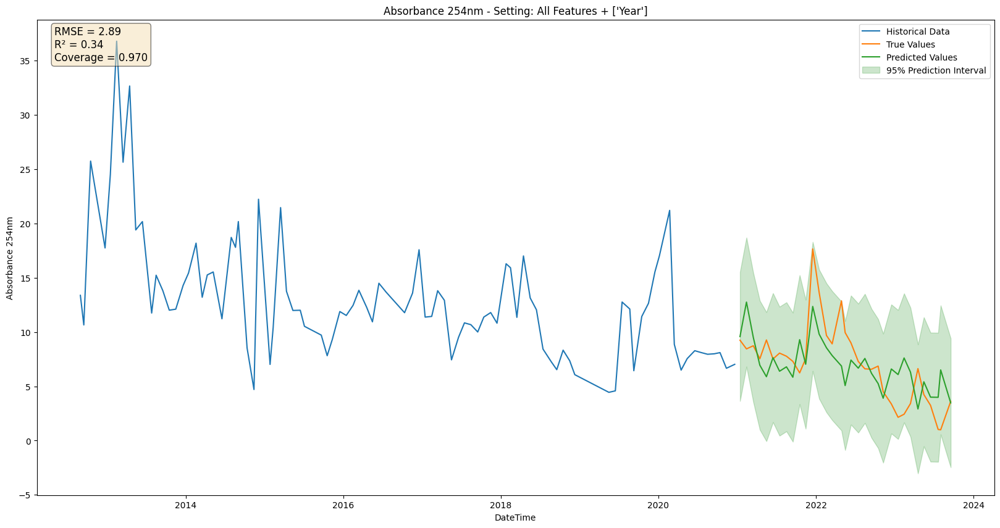

In [162]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test_fit["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test["DateTime"], y=y_med, label="Predicted Values"
)
# plot std of predictions
plt.fill_between(
    y_test["DateTime"],
    y_lower.flatten(),
    y2=y_upper.flatten(),
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.3f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

Comment: prevede un trend crescente, probabilmente dato da qualche feature 

### Store Results

In [164]:
lgbm_pred = y_med
lgbm_lower_bound = y_lower
lgbm_upper_bound = y_upper
lgbm_rmse = rmse
lgbm_r2 = r2
lgbm_mae = mae
lgbm_nse = nseff
lgbm_coverage = coverage_cqr

# Neural Network

## Split Data

In [165]:
further_features = ["Year", "Season", "Month", "Timestamp"]

to_drop = ["Timestamp", "Season", "Month"]

further_features = [
    feature for feature in further_features if feature not in to_drop
]

X_columns_to_drop = to_drop + ["Absorbance 254nm"]

X = full_df[full_df.columns.difference(X_columns_to_drop)]

y = full_df[["DateTime", "Absorbance 254nm"]]

In [166]:
# split data such that 2022 and 2023 are test data
X_train = X[X["DateTime"] < "2021-01-01"]
X_test = X[X["DateTime"] >= "2021-01-01"]

y_train = y[y["DateTime"] < "2021-01-01"]
y_test = y[y["DateTime"] >= "2021-01-01"]

In [167]:
X_train_fit = X_train[X_train.columns.difference(["DateTime"])]
X_test_fit = X_test[X_test.columns.difference(["DateTime"])]

y_train_fit = y_train.copy()
y_test_fit = y_test.copy()

In [168]:
scaler = StandardScaler()
# scale the data and keep the column names
X_train_fit = scaler.fit_transform(X_train_fit)
X_test_fit = scaler.transform(X_test_fit)

X_train_fit = pd.DataFrame(
    X_train_fit, columns=X_train.columns.difference(["DateTime"])
)
X_test_fit = pd.DataFrame(
    X_test_fit, columns=X_test.columns.difference(["DateTime"])
)

## Train the model

### Hyperparameter Tuning

In [ ]:
def fit_and_validate_nn_model(
    X,
    y,
    train_index,
    val_index,
    params,
):
    X_tr, X_val = X.iloc[train_index, :], X.iloc[val_index, :]
    y_tr, y_val = y.iloc[train_index], y.iloc[val_index]

    model = MLPRegressor(
        random_state=42,
        hidden_layer_sizes=tuple(params["layers"]),
        max_iter=1000,
    )

    param = params.copy()
    param.pop("layers")
    model.set_params(**param)

    # train model
    _ = model.fit(X_tr, y_tr)

    # obtain predictions
    y_val_pred = model.predict(X_val)

    # return metrics
    return mean_squared_error(y_val, y_val_pred, squared=False)

In [101]:
def objective(trial: optuna.trial.Trial) -> float:
    config = {
        "layers": [
            trial.suggest_int(f"n_units_{i}", 50, 100, step=5)
            for i in range(trial.suggest_int("n_layers", 2, 2))
        ],
        "activation": trial.suggest_categorical(
            "activation", ["identity", "logistic", "tanh", "relu"]
        ),
        "solver": trial.suggest_categorical("solver", ["sgd", "adam"]),
        "alpha": trial.suggest_float("alpha", 1e-5, 1),
        "learning_rate": trial.suggest_categorical(
            "learning_rate", ["constant", "invscaling", "adaptive"]
        ),
        "power_t": trial.suggest_float("power_t", 0.1, 1),
        "beta_1": trial.suggest_float("beta_1", 0.1, 1),
        "beta_2": trial.suggest_float("beta_2", 0.1, 1),
        "epsilon": trial.suggest_float("epsilon", 1e-8, 1),
        "early_stopping": True,
    }

    n_splits = 5
    cv = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    cv_mae = [None] * n_splits
    for i, (train_index, test_index) in enumerate(
        cv.split(X_train_fit, y_train_fit["Absorbance 254nm"])
    ):
        cv_mae[i] = fit_and_validate_nn_model(
            X_train_fit,
            y_train_fit["Absorbance 254nm"],
            train_index,
            test_index,
            config,
        )

    # saving the individual fold holdout metrics
    # uncomment this line if you don't want this
    trial.set_user_attr("split_mae", cv_mae)

    return np.mean(cv_mae)

In [103]:
study = optuna.create_study(
    direction="minimize",
    storage="sqlite:///NeuralNetwork.sqlite3",
    study_name="Hyperparameter Tuning - All Features"
    + " + "
    + str(further_features),
    load_if_exists=True,
)
study.optimize(objective, n_trials=100, show_progress_bar=True)

[I 2024-04-16 22:23:00,767] Using an existing study with name 'Hyperparameter Tuning - All Features + ['Year']' instead of creating a new one.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2024-04-16 22:23:05,199] Trial 300 finished with value: 4.175630056993797 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.606330587291009, 'learning_rate': 'invscaling', 'power_t': 0.7242638462710876, 'beta_1': 0.18247192385416827, 'beta_2': 0.6016281511190243, 'epsilon': 0.8206413372652914}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:07,954] Trial 301 finished with value: 5.481260283986474 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.6695330552869436, 'learning_rate': 'invscaling', 'power_t': 0.7112291090742614, 'beta_1': 0.10050740455030065, 'beta_2': 0.6358033554567541, 'epsilon': 0.6883900977726837}. Best is trial 43 with value: 4.109281265709937.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:698: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


[I 2024-04-16 22:23:10,608] Trial 302 finished with value: 4.217830471570712 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.7108386905102713, 'learning_rate': 'invscaling', 'power_t': 0.6812355218215109, 'beta_1': 0.16206453130373533, 'beta_2': 0.6224700976960427, 'epsilon': 0.7425064987642854}. Best is trial 43 with value: 4.109281265709937.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


[I 2024-04-16 22:23:14,760] Trial 303 finished with value: 4.2973941839702 and parameters: {'n_layers': 2, 'n_units_0': 70, 'n_units_1': 65, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.5730033964852199, 'learning_rate': 'invscaling', 'power_t': 0.7414571147391084, 'beta_1': 0.13273527973031868, 'beta_2': 0.5705726344098234, 'epsilon': 0.640801112430537}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:17,364] Trial 304 finished with value: 4.286565484766737 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 75, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.6342030192005913, 'learning_rate': 'invscaling', 'power_t': 0.709770842767446, 'beta_1': 0.10012692022949256, 'beta_2': 0.602313663589163, 'epsilon': 0.6639539721990962}. Best is trial 43 with value: 4.109281265709937.


/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


[I 2024-04-16 22:23:20,983] Trial 305 finished with value: 4.168923031249679 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.6830998151361528, 'learning_rate': 'invscaling', 'power_t': 0.3848272488402014, 'beta_1': 0.13656760374465282, 'beta_2': 0.8162562374974323, 'epsilon': 0.6989534173187881}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:24,410] Trial 306 finished with value: 4.175140876058751 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.6565628358523946, 'learning_rate': 'invscaling', 'power_t': 0.644941677750088, 'beta_1': 0.12459430863926346, 'beta_2': 0.5460258004076485, 'epsilon': 0.7954552267075954}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:26,267] Trial 307 finished with value: 4.717764218732634 and parameters: {'n_layers': 2, 'n_units_0': 80, 'n_units_1': 70, 'activation': 'relu', 'solve

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


[I 2024-04-16 22:23:30,684] Trial 308 finished with value: 4.5041605417189805 and parameters: {'n_layers': 2, 'n_units_0': 55, 'n_units_1': 80, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.7289801383872295, 'learning_rate': 'invscaling', 'power_t': 0.75861058850851, 'beta_1': 0.11716103152173446, 'beta_2': 0.6831836432123535, 'epsilon': 0.6780232126751895}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:34,663] Trial 309 finished with value: 4.499620495511682 and parameters: {'n_layers': 2, 'n_units_0': 70, 'n_units_1': 70, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.2904944464105321, 'learning_rate': 'invscaling', 'power_t': 0.6908174499982609, 'beta_1': 0.1400248846385363, 'beta_2': 0.6174252417259481, 'epsilon': 0.7595778419359839}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:37,280] Trial 310 finished with value: 4.224931014538105 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'relu', 'solver

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


[I 2024-04-16 22:23:44,160] Trial 311 finished with value: 12.946636801196618 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.6092630486728325, 'learning_rate': 'invscaling', 'power_t': 0.7774235159014602, 'beta_1': 0.11755099825187806, 'beta_2': 0.6680357736139988, 'epsilon': 0.6416471848463738}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:48,351] Trial 312 finished with value: 4.609558178428417 and parameters: {'n_layers': 2, 'n_units_0': 80, 'n_units_1': 75, 'activation': 'tanh', 'solver': 'adam', 'alpha': 0.6867717160246837, 'learning_rate': 'invscaling', 'power_t': 0.3542551004696533, 'beta_1': 0.13233196739766148, 'beta_2': 0.5859987308874921, 'epsilon': 0.6172250052625367}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:50,567] Trial 313 finished with value: 4.593829938558677 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 65, 'activation': 'relu', 'solv

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:698: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


[I 2024-04-16 22:23:57,037] Trial 315 finished with value: 4.866845068551263 and parameters: {'n_layers': 2, 'n_units_0': 70, 'n_units_1': 70, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.5802293831720987, 'learning_rate': 'invscaling', 'power_t': 0.746293508199731, 'beta_1': 0.617610003893149, 'beta_2': 0.651368759512417, 'epsilon': 0.09846536946236917}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:23:58,993] Trial 316 finished with value: 4.297378886597623 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.6759048245623042, 'learning_rate': 'invscaling', 'power_t': 0.6965644265040162, 'beta_1': 0.18680996991048876, 'beta_2': 0.5786795399138562, 'epsilon': 0.1673803642387573}. Best is trial 43 with value: 4.109281265709937.
[I 2024-04-16 22:24:00,092] Trial 317 finished with value: 4.445787749633128 and parameters: {'n_layers': 2, 'n_units_0': 75, 'n_units_1': 70, 'activation': 'identity', 'sol

In [638]:
study.best_params

{'n_layers': 2,
 'n_units_0': 85,
 'n_units_1': 75,
 'activation': 'relu',
 'solver': 'adam',
 'alpha': 0.7765540584565614,
 'learning_rate': 'constant',
 'power_t': 0.3382710741601535,
 'beta_1': 0.19887581875693028,
 'beta_2': 0.984060053664114,
 'epsilon': 0.32827083622604075}

In [169]:
params = {
    'n_layers': 2,
    'n_units_0': 85,
    'n_units_1': 75,
    'activation': 'relu',
    'solver': 'adam',
    'alpha': 0.7765540584565614,
    'learning_rate': 'constant',
    'power_t': 0.3382710741601535,
    'beta_1': 0.19887581875693028,
    'beta_2': 0.984060053664114,
    'epsilon': 0.32827083622604075
}

In [170]:
# params["n_units_1"] = 80
# params['learning_rate'] = 'invscaling'
params["activation"] = "identity"

hidden_layer_sizes = [
    params[f"n_units_{i}"] for i in range(params["n_layers"])
]

for i in range(params["n_layers"]):
    params.pop(f"n_units_{i}")

params.pop("n_layers")

2

#### Train model with mapie

In [171]:
alpha = 0.1
estimator = MLPRegressor(
    random_state=42,
    hidden_layer_sizes=hidden_layer_sizes,
    max_iter=1000,
    early_stopping=True,
    **params
)

estimator.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MLPRegressor(activation='identity', alpha=0.7765540584565614,
             beta_1=0.19887581875693028, beta_2=0.984060053664114,
             early_stopping=True, epsilon=0.32827083622604075,
             hidden_layer_sizes=[85, 75], max_iter=1000,
             power_t=0.3382710741601535, random_state=42)

In [172]:
# Calibrate uncertainties on calibration set
mapie_cqr = MapieRegressor(estimator, cv="prefit", random_state=42)
mapie_cqr.fit(X_train_fit, y_train_fit["Absorbance 254nm"])

MapieRegressor(cv='prefit',
               estimator=MLPRegressor(activation='identity',
                                      alpha=0.7765540584565614,
                                      beta_1=0.19887581875693028,
                                      beta_2=0.984060053664114,
                                      early_stopping=True,
                                      epsilon=0.32827083622604075,
                                      hidden_layer_sizes=[85, 75],
                                      max_iter=1000, power_t=0.3382710741601535,
                                      random_state=42),
               method='base', random_state=42)

## Prediction

In [173]:
# Evaluate prediction and coverage level on testing set
y_med, y_pis_cqr = mapie_cqr.predict(X_test_fit, alpha=alpha)
y_lower = y_pis_cqr[:, 0, 0]
y_upper = y_pis_cqr[:, 1, 0]

coverage_cqr = regression_coverage_score(
    y_test_fit["Absorbance 254nm"], y_lower, y_upper
)

/Users/massimilianoarca/Library/Caches/pypoetry/virtualenvs/climate-change-MEYtuKH4-py3.11/lib/python3.11/site-packages/mapie/utils.py:598: UserWarning: WARNING: The predictions are ill-sorted.
  warnings.warn(


In [174]:
print("Coverage:", coverage_cqr)

Coverage: 0.9696969696969697


#### Compute Measures

In [175]:
rmse = np.sqrt(
    mean_squared_error(y_test_fit["Absorbance 254nm"], y_med)
)
r2 = r2_score(y_test_fit["Absorbance 254nm"], y_med)

mae = mean_absolute_error(y_test_fit["Absorbance 254nm"], y_med)

nseff = nse(y_med, y_test_fit["Absorbance 254nm"])

print(f"RMSE: {rmse:.2f}")
print(f"R\u00b2: {r2:.2f}")
print(f"MAE: {mae:.2f}")
print(f"NSE: {nseff:.2f}")


RMSE: 2.71
R²: 0.42
MAE: 2.25
NSE: 0.42


## Plots

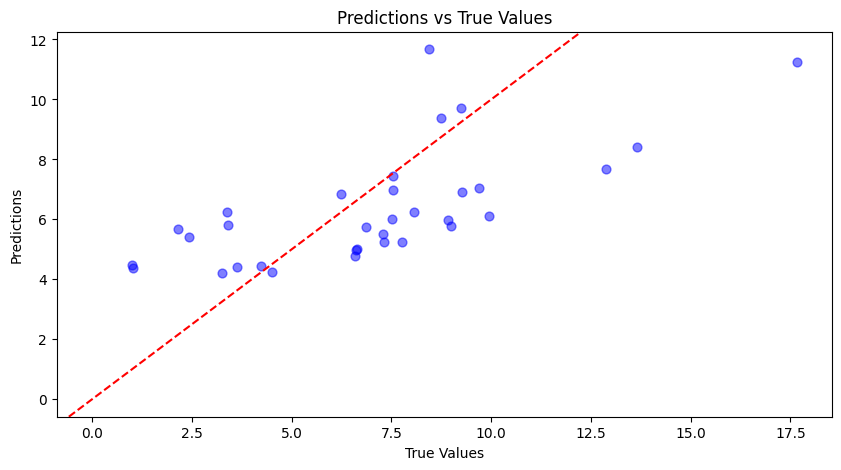

In [176]:
# plot the true vs predicted values
plt.figure(figsize=(10, 5))
plt.scatter(
    y_test_fit["Absorbance 254nm"], y_med, c="b", s=40, alpha=0.5
)
plt.axline([0, 0], [1, 1], color="red", linestyle="--")
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.title(f"Predictions vs True Values")
plt.show()

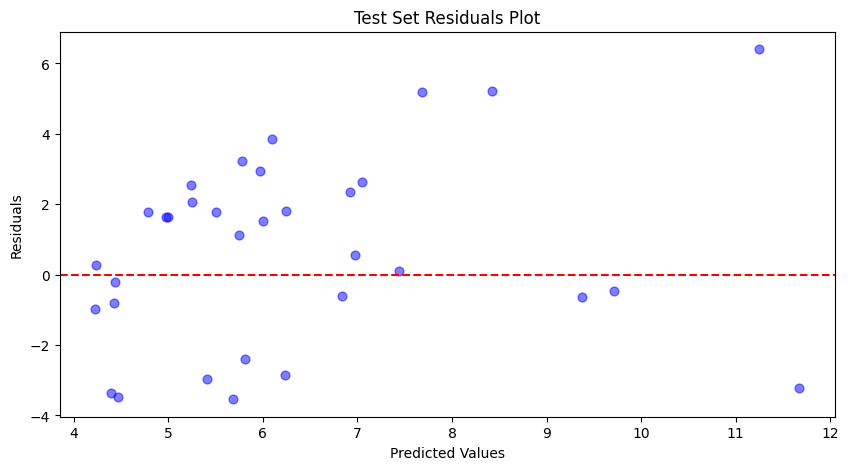

In [177]:
# plot the residuals
residuals = y_test_fit["Absorbance 254nm"] - y_med
plt.figure(figsize=(10, 5))
plt.scatter(y_med, residuals, c="b", s=40, alpha=0.5)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Test Set Residuals Plot")
plt.show()

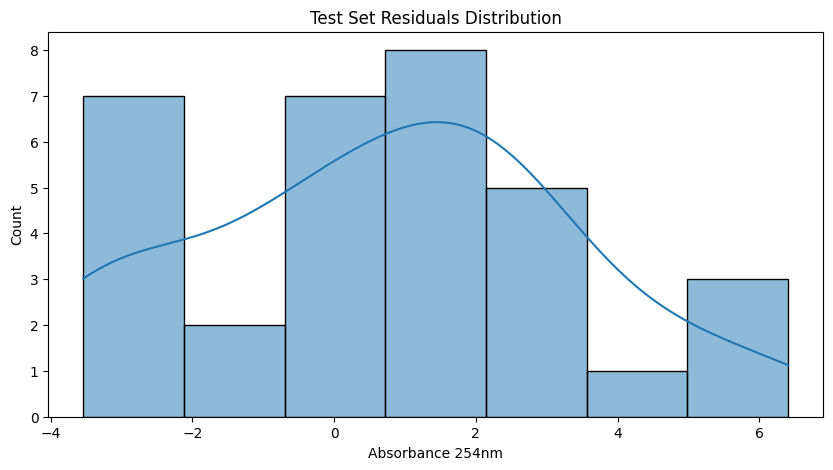

In [178]:
# plot the distribution of the residuals
plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Test Set Residuals Distribution")
plt.show()

In [179]:
# get training residuals
train_predictions, _ = mapie_cqr.predict(X_train_fit, alpha=alpha)
train_residuals = y_train_fit["Absorbance 254nm"] - train_predictions

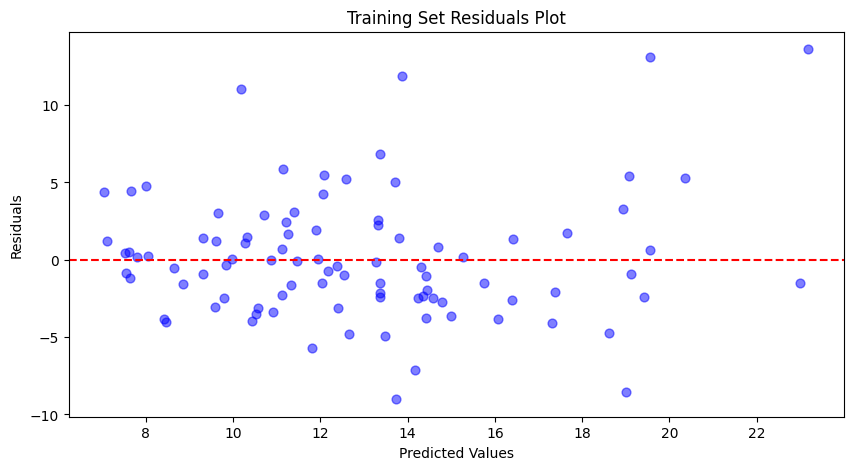

In [180]:
# plot the training residuals
plt.figure(figsize=(10, 5))
plt.scatter(
    train_predictions.flatten(), train_residuals, c="b", s=40, alpha=0.5
)
plt.axhline(y=0, color="r", linestyle="--")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Training Set Residuals Plot")
plt.show()

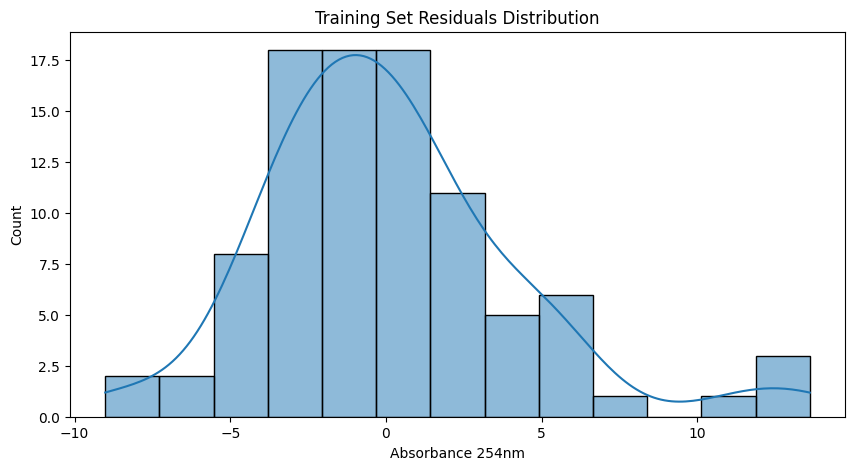

In [181]:
# plot the distribution of the training residuals
plt.figure(figsize=(10, 5))
sns.histplot(train_residuals, kde=True)
plt.title("Training Set Residuals Distribution")
plt.show()

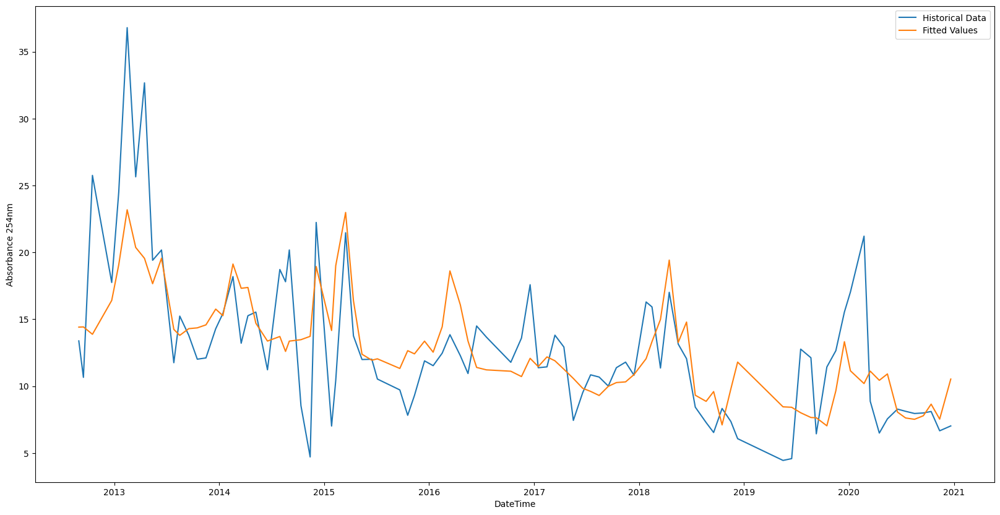

In [182]:
# plot the time series fitted values
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=train_predictions,
    label="Fitted Values",
)

plt.show()

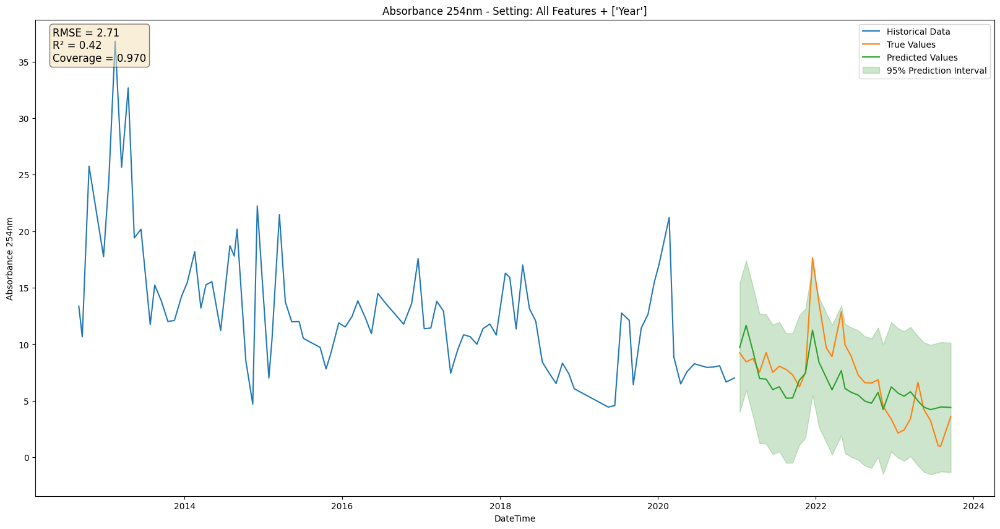

In [183]:
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train_fit["DateTime"],
    y=y_train_fit["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test_fit["DateTime"],
    y=y_test_fit["Absorbance 254nm"],
    label="True Values",
)
sns.lineplot(
    x=y_test_fit["DateTime"], y=y_med, label="Predicted Values"
)
# plot std of predictions
plt.fill_between(
    y_test_fit["DateTime"],
    y_lower.flatten(),
    y2=y_upper.flatten(),
    alpha=0.2,
    label="95% Prediction Interval",
    color="g",
)
plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"RMSE = {rmse:.2f}",
        f"R\u00b2 = {r2:.2f}",
        f"Coverage = {coverage_cqr:.3f}",
    )
)

plt.text(
    y_train_fit["DateTime"].iloc[0] - pd.Timedelta(days=120),
    35,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(
    f"Absorbance 254nm - Setting: All Features + {further_features}"
)

plt.legend()
plt.show()

## Store Results

In [184]:
nn_pred = y_med
nn_lower_bound = y_lower
nn_upper_bound = y_upper
nn_rmse = rmse
nn_r2 = r2
nn_mae = mae
nn_nse = nseff
nn_coverage = coverage_cqr

# Final Plot

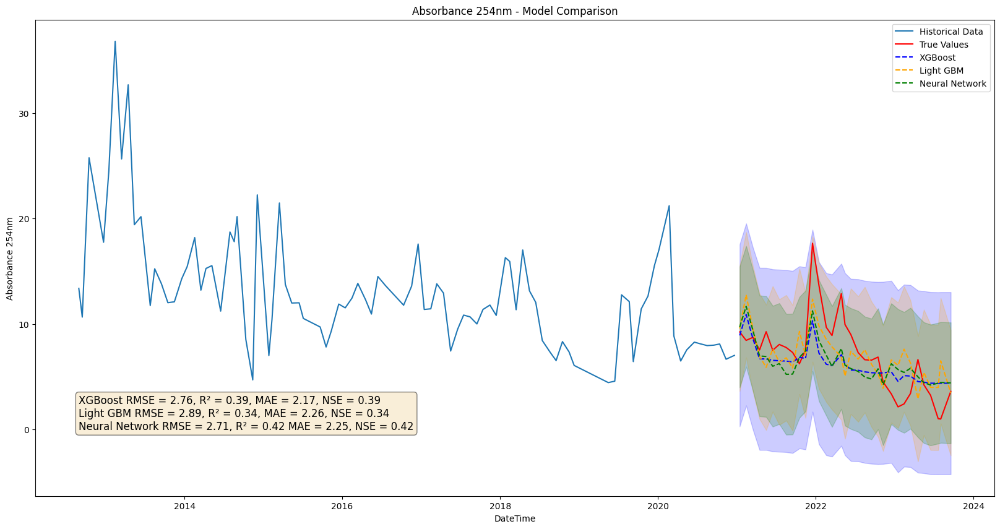

In [185]:
# create a plot for the comparison of the models
plt.figure(figsize=(20, 10))
sns.lineplot(
    x=y_train["DateTime"],
    y=y_train["Absorbance 254nm"],
    label="Historical Data",
)
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
    color="red",
)

# Linear Regression
sns.lineplot(
    x=y_test["DateTime"],
    y=boost_pred,
    label="XGBoost",
    linestyle="--",
    color="blue",
)
plt.fill_between(
    y_test["DateTime"],
    boost_lower_bound,
    boost_upper_bound,
    alpha=0.2,
    color="blue",
)

# Random Forest
sns.lineplot(
    x=y_test["DateTime"],
    y=lgbm_pred,
    label="Light GBM",
    linestyle="--",
    color="orange",
)
plt.fill_between(
    y_test["DateTime"],
    lgbm_lower_bound,
    lgbm_upper_bound,
    alpha=0.2,
    color="orange",
)

# Neural Network
sns.lineplot(
    x=y_test["DateTime"],
    y=nn_pred,
    label="Neural Network",
    linestyle="--",
    color="green",
)
plt.fill_between(
    y_test["DateTime"],
    nn_lower_bound,
    nn_upper_bound,
    alpha=0.2,
    color="green",
)

plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"XGBoost RMSE = {boost_rmse:.2f}, R\u00b2 = {boost_r2:.2f}, MAE = {boost_mae:.2f}, NSE = {boost_nse:.2f}",
        f"Light GBM RMSE = {lgbm_rmse:.2f}, R\u00b2 = {lgbm_r2:.2f}, MAE = {lgbm_mae:.2f}, NSE = {lgbm_nse:.2f}",
        f"Neural Network RMSE = {nn_rmse:.2f}, R\u00b2 = {nn_r2:.2f} MAE = {nn_mae:.2f}, NSE = {nn_nse:.2f}",
    )
)

plt.text(
    y_train["DateTime"].iloc[0],
    0,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm - Model Comparison")

plt.legend()
plt.show()

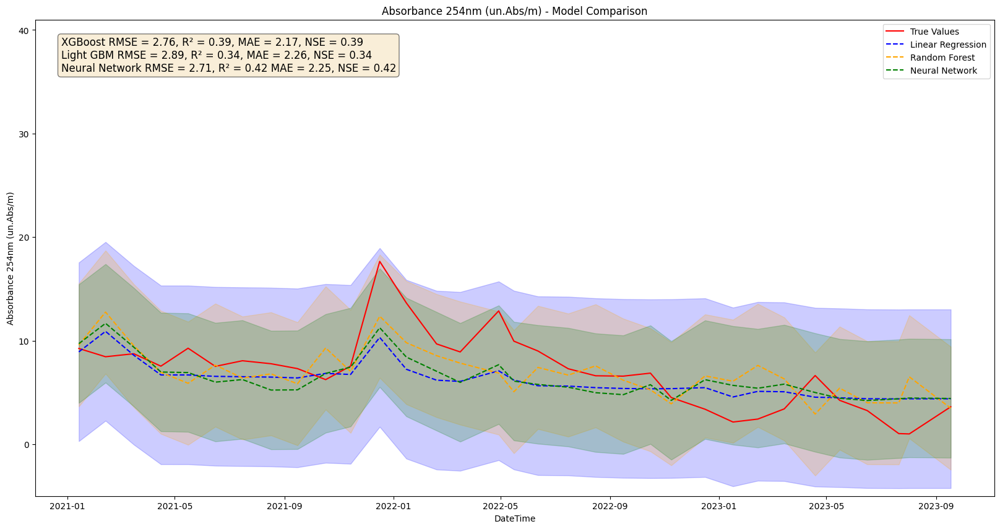

In [186]:
# create a plot for the comparison of the models
plt.figure(figsize=(20, 10))
# sns.lineplot(x=y_train['DateTime'], y=y_train['Absorbance 254nm'], label='Historical Data')
sns.lineplot(
    x=y_test["DateTime"],
    y=y_test["Absorbance 254nm"],
    label="True Values",
    color="red",
)

# Linear Regression
sns.lineplot(
    x=y_test["DateTime"],
    y=boost_pred,
    label="Linear Regression",
    linestyle="--",
    color="blue",
)
plt.fill_between(
    y_test["DateTime"],
    boost_lower_bound,
    boost_upper_bound,
    alpha=0.2,
    color="blue",
)

# Random Forest
sns.lineplot(
    x=y_test["DateTime"],
    y=lgbm_pred,
    label="Random Forest",
    linestyle="--",
    color="orange",
)
plt.fill_between(
    y_test["DateTime"],
    lgbm_lower_bound,
    lgbm_upper_bound,
    alpha=0.2,
    color="orange",
)

# Neural Network
sns.lineplot(
    x=y_test["DateTime"],
    y=nn_pred,
    label="Neural Network",
    linestyle="--",
    color="green",
)
plt.fill_between(
    y_test["DateTime"],
    nn_lower_bound,
    nn_upper_bound,
    alpha=0.2,
    color="green",
)

plt.ylim(-5, 41)

plt.xlabel("DateTime")
plt.ylabel("Absorbance 254nm (un.Abs/m)")

# add rmse and r2 to the plot in a box
props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)

text_string = "\n".join(
    (
        f"XGBoost RMSE = {boost_rmse:.2f}, R\u00b2 = {boost_r2:.2f}, MAE = {boost_mae:.2f}, NSE = {boost_nse:.2f}",
        f"Light GBM RMSE = {lgbm_rmse:.2f}, R\u00b2 = {lgbm_r2:.2f}, MAE = {lgbm_mae:.2f}, NSE = {lgbm_nse:.2f}",
        f"Neural Network RMSE = {nn_rmse:.2f}, R\u00b2 = {nn_r2:.2f} MAE = {nn_mae:.2f}, NSE = {nn_nse:.2f}",
    )
)

plt.text(
    y_test["DateTime"].iloc[0] - pd.Timedelta(days=20),
    36,
    s=text_string,
    fontsize=12,
    bbox=props,
)

plt.title(f"Absorbance 254nm (un.Abs/m) - Model Comparison")

plt.legend()
plt.show()